In [1]:
import os
import warnings
import pymc as pm
import arviz as az
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.stats import gamma, norm, expon
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

warnings.filterwarnings("ignore")

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
# Load the dataset
data_path = os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), "dataset")
data = pd.read_excel(f"{data_path}/data_transformed.xlsx")
# Drop the unnamed column as it is unnecessary for correlation analysis
data = data.drop(columns=['Unnamed: 0'])

In [3]:
data.head(20)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360.00,150,11.881723,1045.50,166,1056.25,113,1692.00,1267.50,13.600,48.875001,0.757754
1,2.0,1292.25,112,9.397165,954.75,103,1173.75,92,1558.75,972.25,13.300,47.700000,0.725487
2,2.2,1402.00,88,8.997817,939.25,131,1140.00,114,1554.50,1074.00,11.900,53.975000,0.750239
3,2.2,1375.50,80,9.228796,948.25,172,1092.00,122,1583.75,1203.25,11.000,60.000000,0.786713
4,1.6,1272.25,51,6.518224,835.50,131,1205.00,116,1490.00,1110.00,11.150,59.575001,0.788794
5,1.2,1197.00,38,4.741012,750.25,89,1336.50,96,1393.00,949.25,11.175,59.175000,0.784772
6,1.2,1185.00,31,3.624399,689.50,62,1461.75,77,1332.75,732.50,11.325,56.775000,0.760312
7,1.0,1136.25,31,3.326677,672.00,62,1453.25,76,1332.75,729.50,10.675,60.000000,0.770238
8,0.9,1094.00,24,2.339416,608.50,45,1579.00,60,1276.00,619.50,10.650,59.674999,0.764819
9,0.7,1066.00,8,1.133431,512.00,16,1918.00,28,1182.00,421.75,11.000,56.175000,0.736560


In [4]:
data.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH'],
      dtype='object')

In [5]:
# initialising min max scaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)
scaled_data = pd.DataFrame(scaled_data, columns=data.columns)

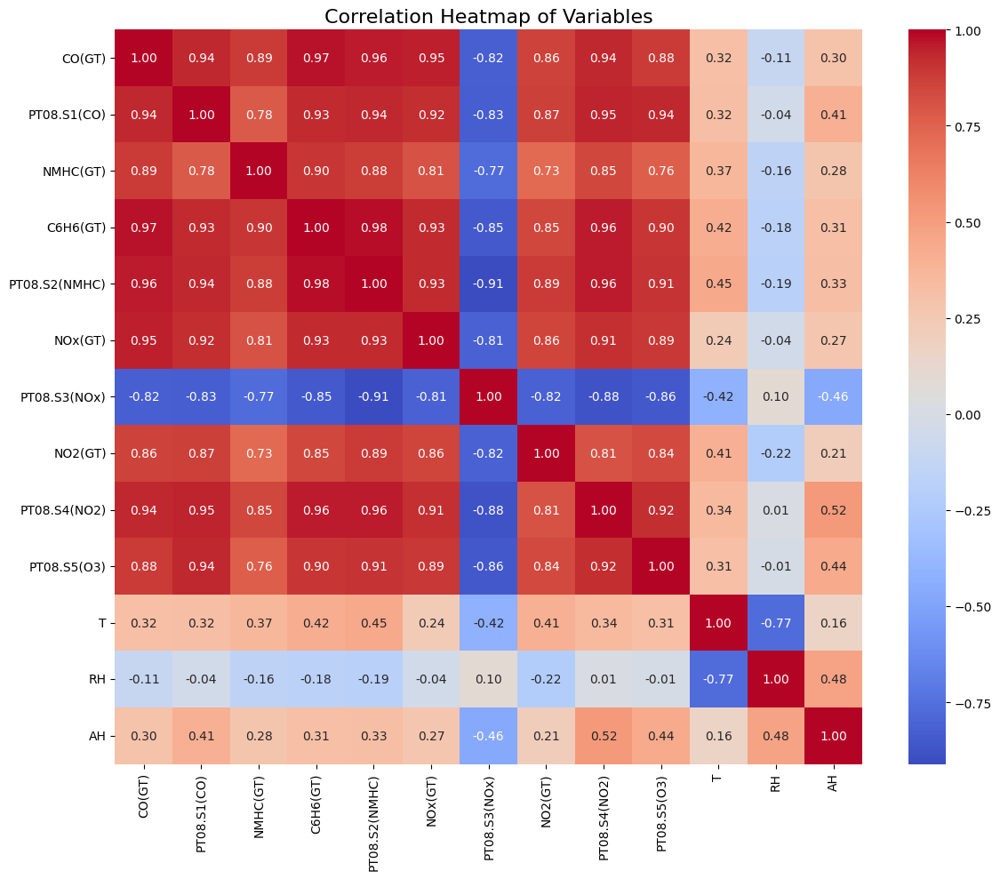

In [6]:
# Calculate the correlation matrix
correlation_matrix = scaled_data.corr()#data.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap of Variables", fontsize=16)
plt.tight_layout()
plt.savefig("correlation_matrix_after_transformation.png")
plt.show()


Train Test Split

In [7]:
# Define the target and predictor variables
target_variable = 'C6H6(GT)'
predictor_variables = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 
                    'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']

# Subset the data to include only the target and predictor variablesa
# data = data[[target_variable] + predictor_variables].dropna()
scaled_data = scaled_data[[target_variable] + predictor_variables].dropna()

In [8]:
# Prepare predictors and target
X = scaled_data[predictor_variables]
y = scaled_data[target_variable]

In [9]:
# Ensure target variable is positive
if (y <= 0).any():
    print("[Info:] Target variable contains non-positive values. Adjusting...")
    y += 0.001

[Info:] Target variable contains non-positive values. Adjusting...


Gamma Model

Gamma Model: Prior Check

In [10]:
# Perform prior predictive checks
with pm.Model() as gamma_model:
    # Reasons:
    # beta_raw and intercept_raw are now unit normal → No extreme values.
    # beta and intercept are scaled deterministically → Helps the sampler.
    # alpha = pm.Exponential(1) is more numerically stable than HalfCauchy.
    beta_raw = pm.Normal("beta_raw", mu=0, sigma=1, shape=X.shape[1])
    beta = pm.Deterministic("beta", beta_raw * 10)

    intercept_raw = pm.Normal("intercept_raw", mu=0, sigma=1)
    intercept = pm.Deterministic("intercept", intercept_raw * 10)

    mu = pm.math.exp(pm.math.dot(X.values, beta) + intercept)
    alpha = pm.Exponential("alpha", lam=1)

    target = pm.Gamma("target", alpha=alpha, beta=alpha / mu, observed=y.values)
    
    # sample from the prior predictive distribution
    prior_predictive = pm.sample_prior_predictive()

Sampling: [alpha, beta_raw, intercept_raw, target]


In [11]:
prior_predictive

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [12]:
prior_gamma_beta_shape = prior_predictive["prior"]["beta"].shape
prior_gamma_beta_shape

(1, 500, 12)

In [13]:
prior_gamma_beta_values = prior_predictive["prior"]["beta"].values.reshape(prior_gamma_beta_shape[1], prior_gamma_beta_shape[2])
prior_gamma_beta_values.shape

(500, 12)

In [14]:
prior_gamma_beta_values.shape

(500, 12)

In [15]:
prior_gamma_intercept = prior_predictive["prior"]["intercept"].values.flatten()
type(prior_gamma_intercept)

numpy.ndarray

In [16]:
prior_gamma_alpha = prior_predictive["prior"]["alpha"].values.flatten()
type(prior_gamma_alpha)

numpy.ndarray

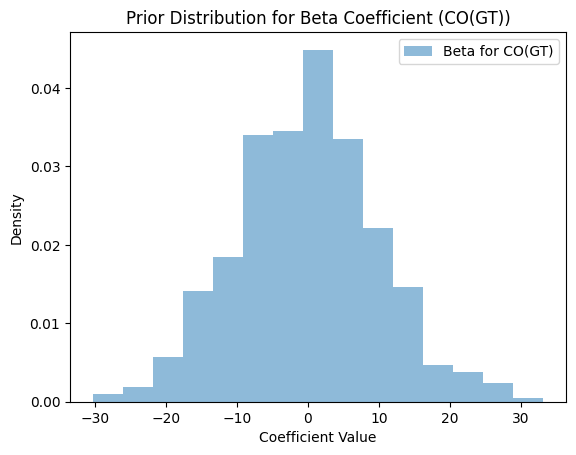

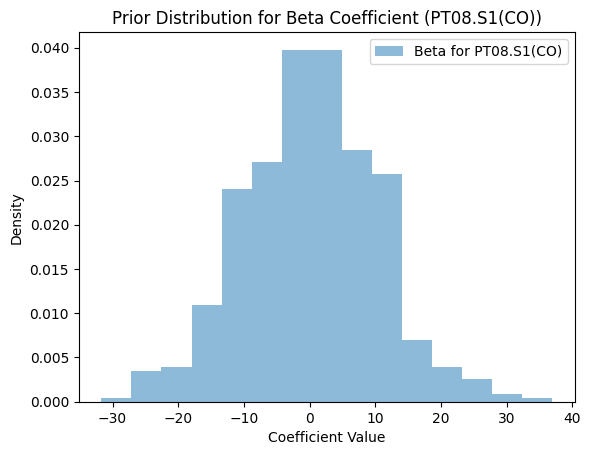

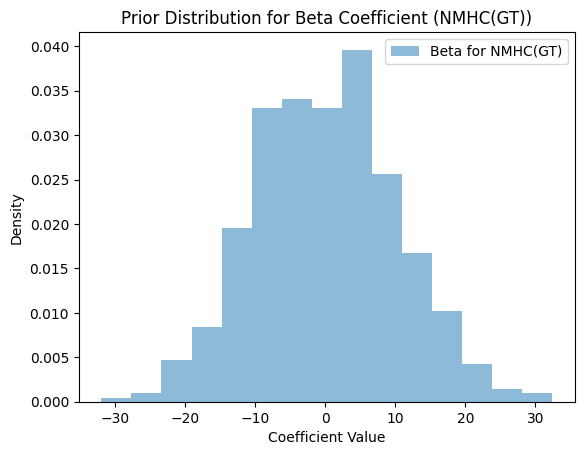

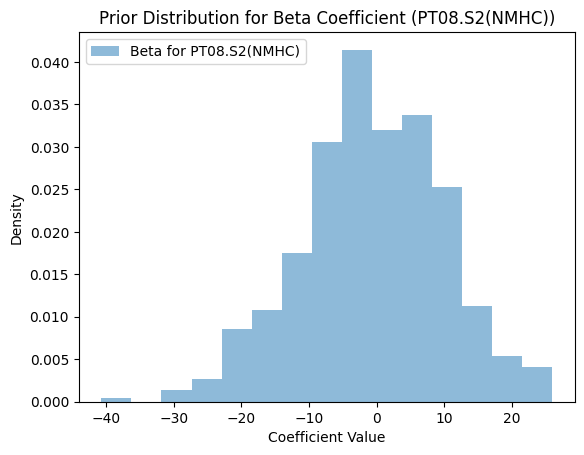

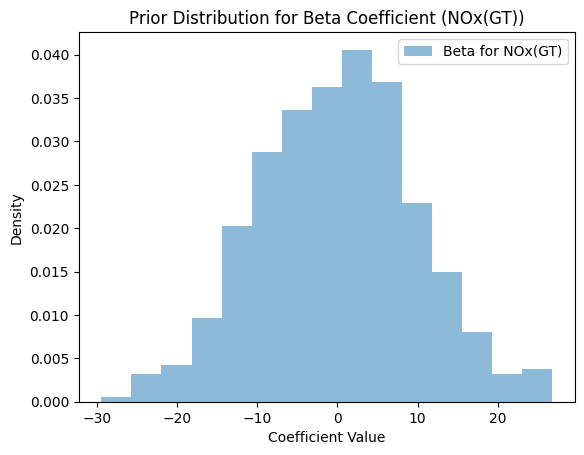

...

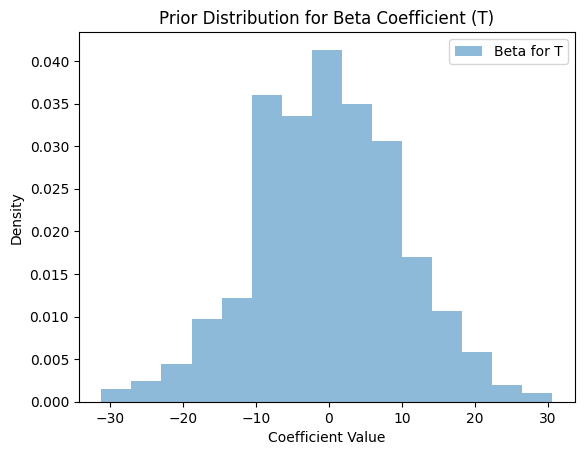

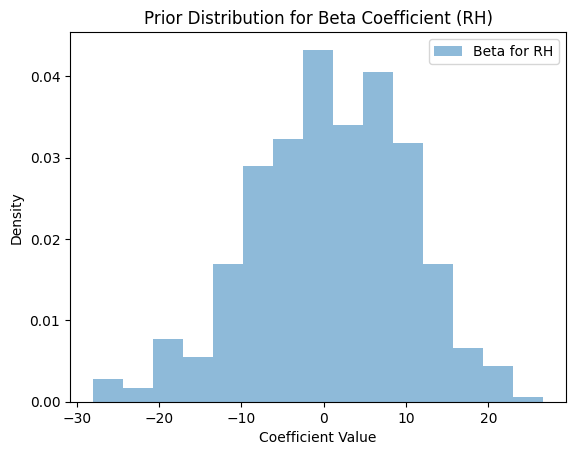

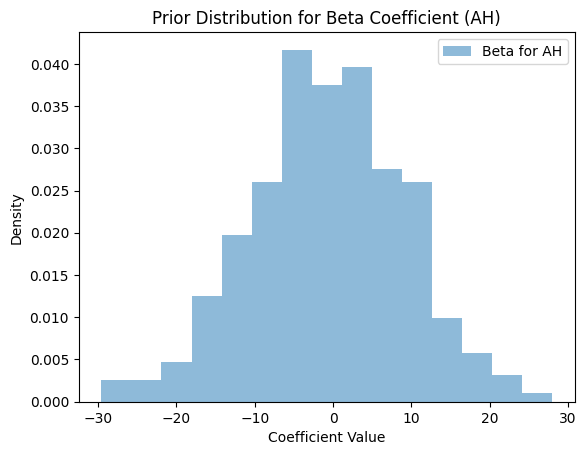

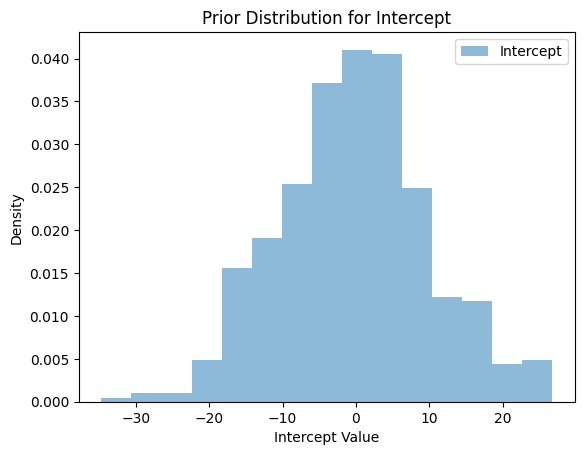

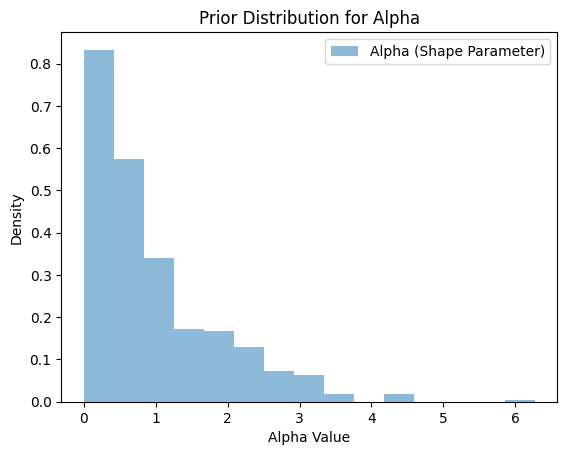

In [17]:
# Plot priors for coefficients (beta)
for i, predictor in enumerate(predictor_variables):
    # prior_predictive["prior"]["beta"]
    plt.hist(prior_gamma_beta_values[:, i], bins=15, density=True, alpha=0.5, label=f"Beta for {predictor}")
    plt.title(f"Prior Distribution for Beta Coefficient ({predictor})")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.show()

# Plot prior for intercept
plt.hist(prior_gamma_intercept, bins=15, density=True, alpha=0.5, label="Intercept")
plt.title("Prior Distribution for Intercept")
plt.xlabel("Intercept Value")
plt.ylabel("Density")
plt.legend()
plt.show()

# Plot prior for alpha
plt.hist(prior_gamma_alpha, bins=15, density=True, alpha=0.5, label="Alpha (Shape Parameter)")
plt.title("Prior Distribution for Alpha")
plt.xlabel("Alpha Value")
plt.ylabel("Density")
plt.legend()
plt.show()

Gamma Model: Posterior Check

In [18]:
# Define the Bayesian Gamma Regression Model
with gamma_model:
    # Initialize model with a custom start point
    initial_point = gamma_model.initial_point()
    
    # Sampling
    idata = pm.sample(
        1000, 
        tune=1000, 
        init="adapt_diag", 
        chains=4, 
        target_accept=0.9, 
        max_treedepth=15, 
        start=initial_point, 
        idata_kwargs = {'log_likelihood': True})#, return_inferencedata=True

# Summarize the posterior
summary = idata.posterior#.to_dataframe()
# summary.head()


Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 3 jobs)
NUTS: [beta_raw, intercept_raw, alpha]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 135 seconds.


In [19]:
X.shape

(827, 12)

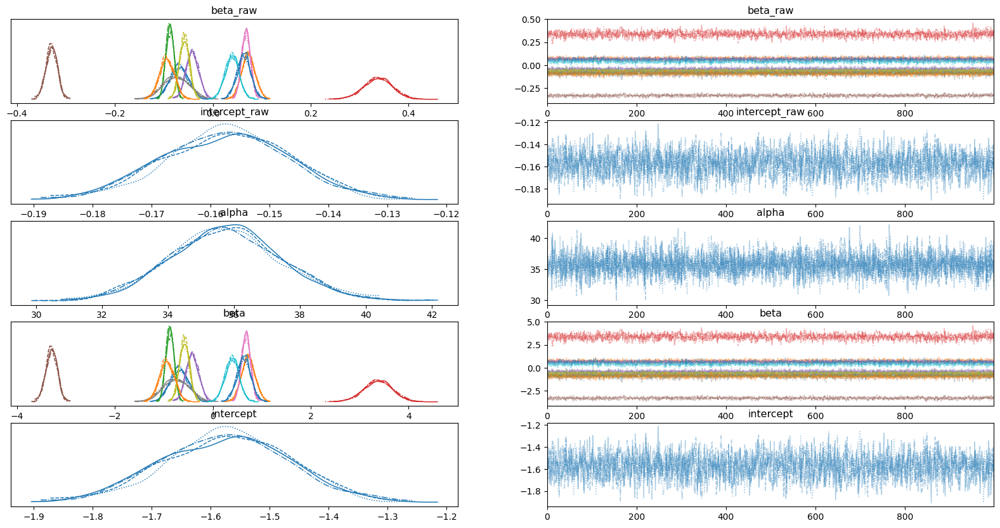

In [20]:
# Save and display posterior diagnostics
# posterior_summary = az.summary(summary)
az.plot_trace(summary, figsize=(20, 10), compact=True) #, var_names=scaled_data.columns
# plt.savefig("traceplot_beta_intercept_alpha.png")
plt.show()

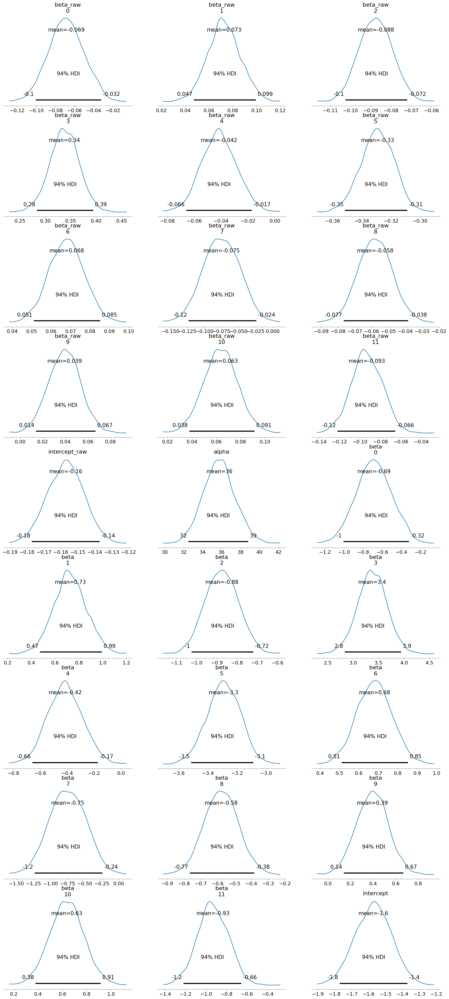

In [21]:
az.plot_posterior(summary)
# plt.savefig("posterior_beta_intercept_alpha.png")
plt.show()

# Display the posterior summary
# posterior_summary.to_csv('/mnt/data/posterior_summary.csv')
# posterior_summary

In [22]:
# Extract posterior samples for beta
gamma_beta_posterior = idata.posterior["beta"]
print(gamma_beta_posterior)

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 12)> Size: 384kB
array([[[-0.53676253,  0.84236566, -0.9367327 , ...,  0.31964723,
          0.61630958, -0.92536843],
        [-0.66023143,  0.68968607, -0.85302626, ...,  0.38656767,
          0.59792009, -0.96989068],
        [-0.46657171,  0.70247877, -0.82116064, ...,  0.52241131,
          0.75651327, -0.97388192],
        ...,
        [-0.69538685,  0.73734985, -0.99292785, ...,  0.31490317,
          0.51246097, -0.75525646],
        [-0.56419482,  0.70741659, -0.87914172, ...,  0.29420382,
          0.47318019, -0.82686751],
        [-0.51568854,  0.69717171, -0.89365164, ...,  0.26026719,
          0.50301376, -0.85591153]],

       [[-0.72082553,  0.79257422, -0.94083552, ...,  0.69658792,
          0.90997251, -1.34923631],
        [-0.65763067,  0.66497106, -0.88174426, ...,  0.70620947,
          0.87916599, -1.23267157],
        [-0.51081679,  0.70179166, -0.92395432, ...,  0.64882119,
          0.93050402, -1.2

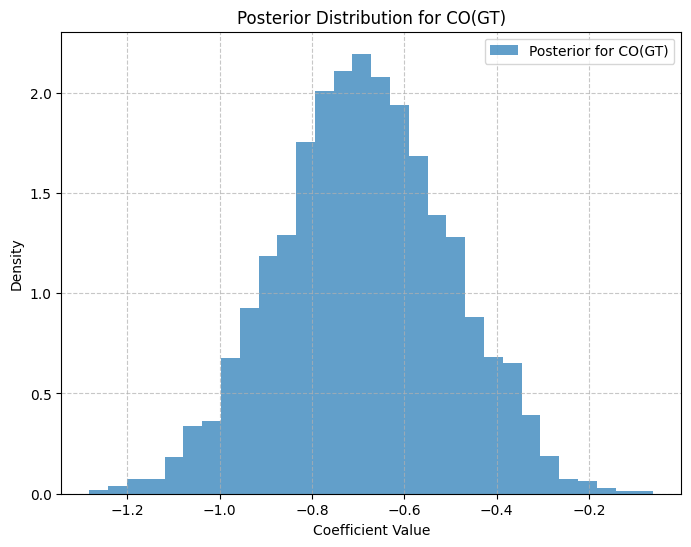

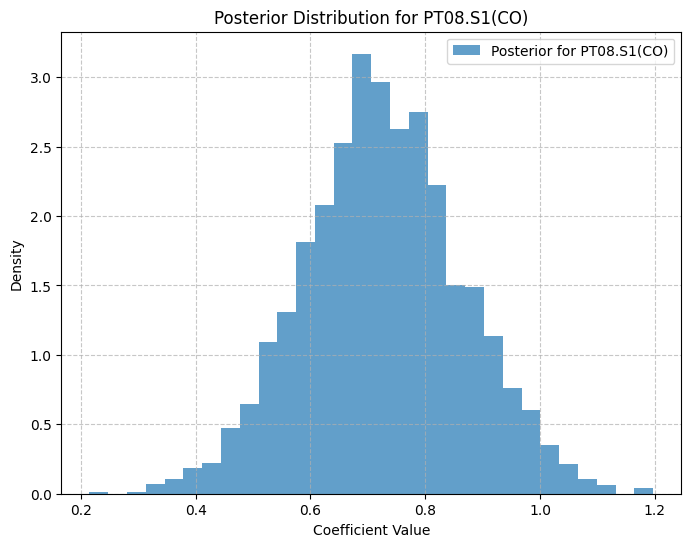

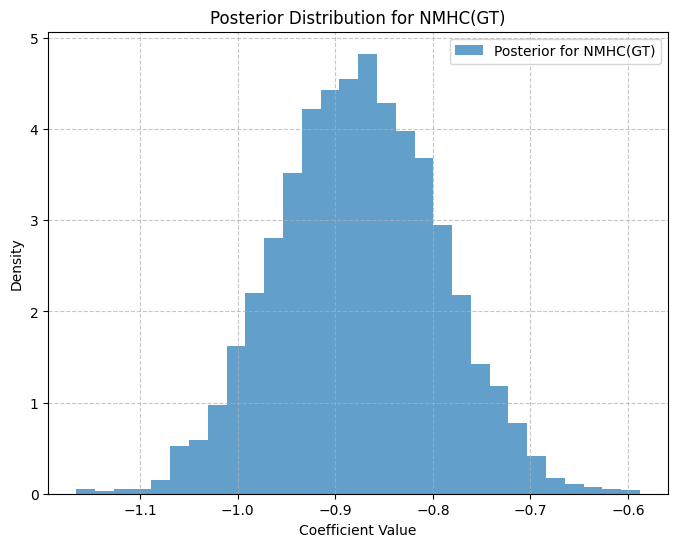

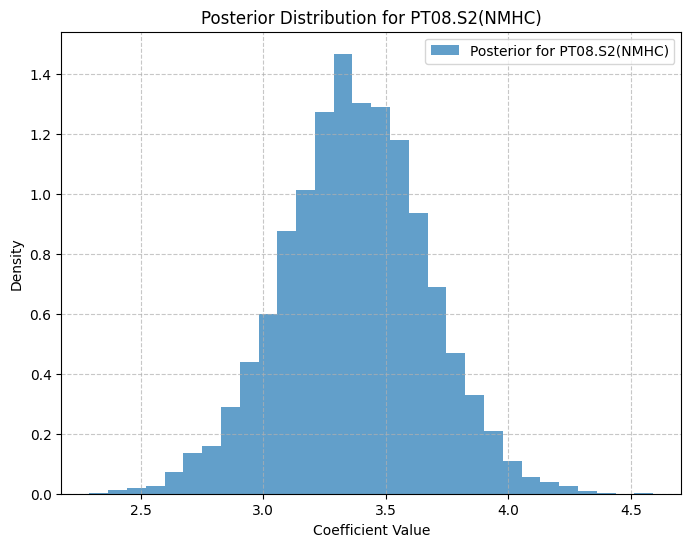

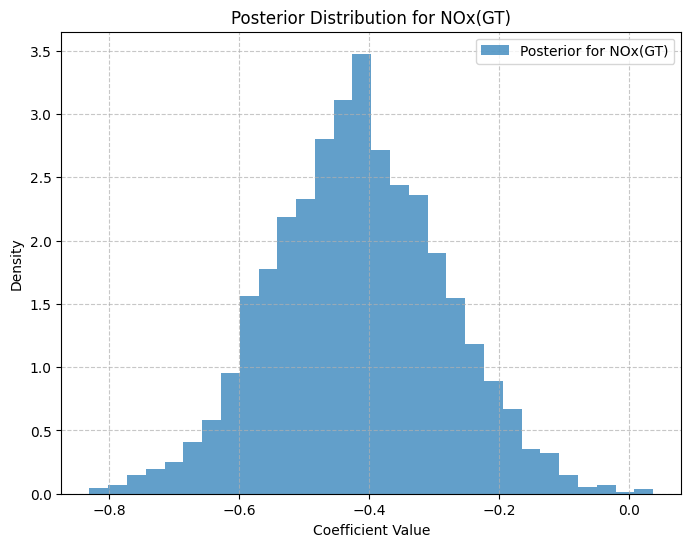

...

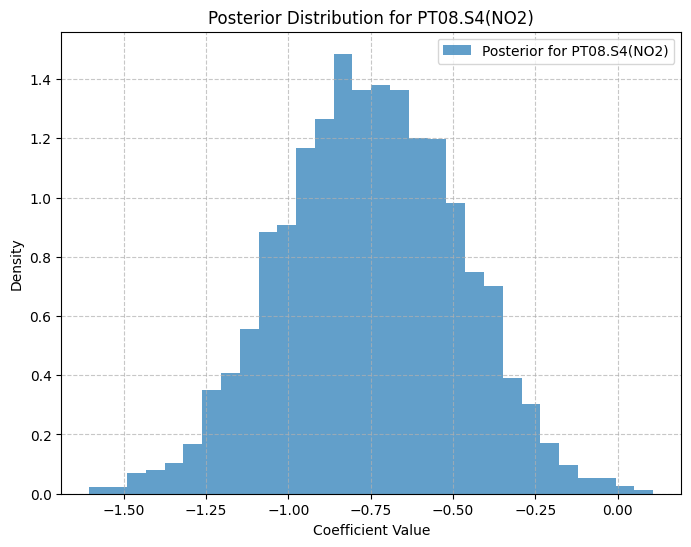

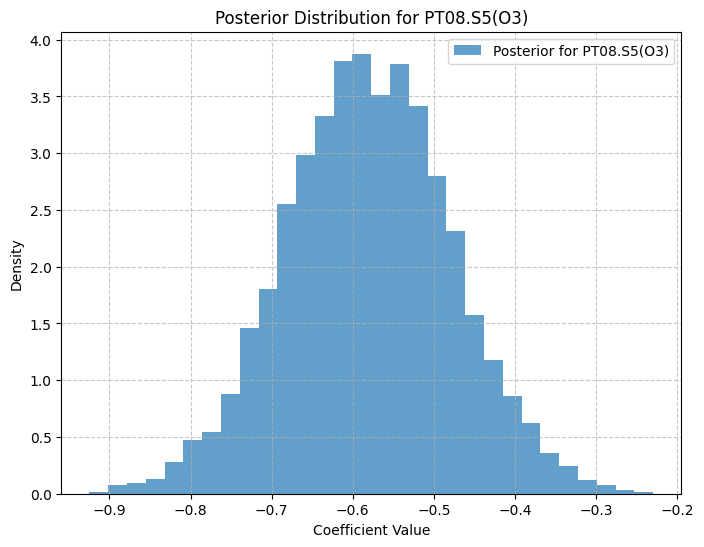

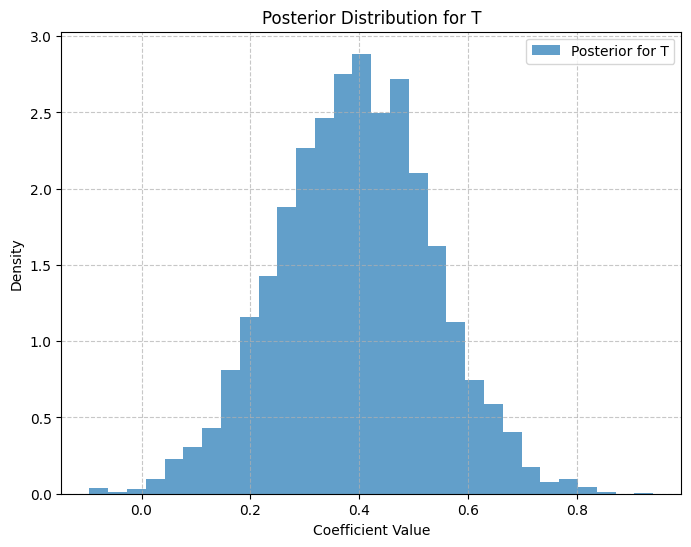

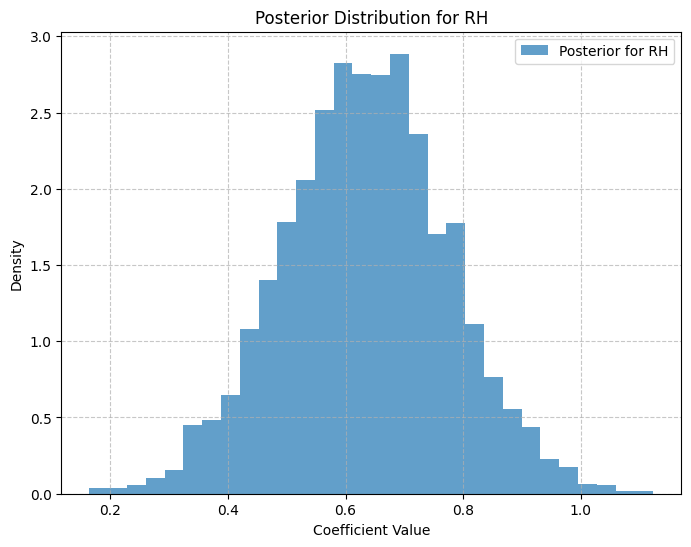

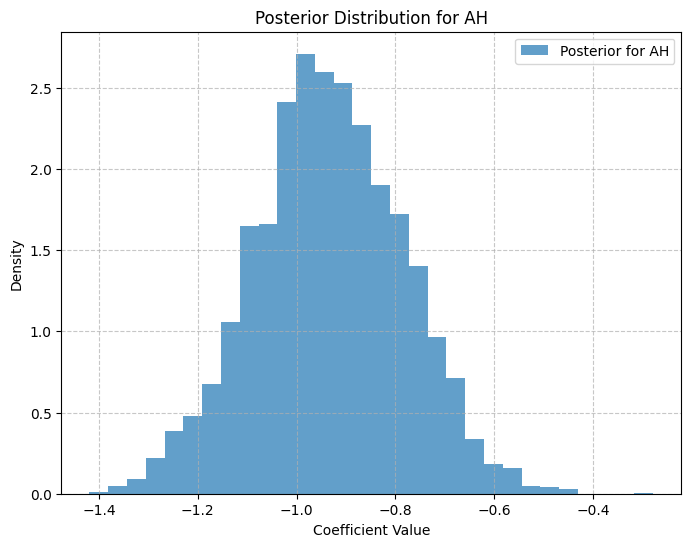

In [23]:
# Iterate through predictors and plot their posterior distributions
for i, predictor in enumerate(predictor_variables):
    # Extract posterior samples for the i-th predictor
    predictor_posterior = gamma_beta_posterior.sel(beta_dim_0=i).values.flatten()  # Convert to NumPy array

    # Plot the posterior distribution
    plt.figure(figsize=(8, 6))
    plt.hist(predictor_posterior, bins=30, density=True, alpha=0.7, label=f"Posterior for {predictor}")
    plt.title(f"Posterior Distribution for {predictor}")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.show()


In [24]:
# Summarize the posterior
# 95% credible interval
posterior_summary = az.summary(idata, var_names=["beta"], hdi_prob=0.95)
print(posterior_summary)

           mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  -0.687  0.184    -1.044     -0.333      0.004    0.003    2282.0   
beta[1]   0.726  0.139     0.452      0.993      0.002    0.002    3328.0   
beta[2]  -0.876  0.082    -1.031     -0.713      0.001    0.001    3095.0   
beta[3]   3.374  0.292     2.833      3.986      0.007    0.005    1738.0   
beta[4]  -0.416  0.131    -0.682     -0.167      0.002    0.002    2963.0   
beta[5]  -3.293  0.115    -3.522     -3.075      0.003    0.002    1860.0   
beta[6]   0.679  0.090     0.497      0.851      0.002    0.001    3416.0   
beta[7]  -0.751  0.268    -1.266     -0.243      0.006    0.004    2267.0   
beta[8]  -0.581  0.102    -0.774     -0.373      0.002    0.001    3493.0   
beta[9]   0.393  0.141     0.129      0.680      0.003    0.002    1828.0   
beta[10]  0.634  0.141     0.365      0.922      0.003    0.002    1875.0   
beta[11] -0.935  0.151    -1.234     -0.644      0.004    0.003    1668.0   

In [25]:
print("Gamma Posterior Summary:")
# summary for posterior of gamma regression
posterior_summary

Gamma Posterior Summary:


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[0],-0.687,0.184,-1.044,-0.333,0.004,0.003,2282.0,2749.0,1.0
beta[1],0.726,0.139,0.452,0.993,0.002,0.002,3328.0,2968.0,1.0
beta[2],-0.876,0.082,-1.031,-0.713,0.001,0.001,3095.0,3297.0,1.0
beta[3],3.374,0.292,2.833,3.986,0.007,0.005,1738.0,2149.0,1.0
beta[4],-0.416,0.131,-0.682,-0.167,0.002,0.002,2963.0,2264.0,1.0
beta[5],-3.293,0.115,-3.522,-3.075,0.003,0.002,1860.0,2576.0,1.0
beta[6],0.679,0.090,0.497,0.851,0.002,0.001,3416.0,3066.0,1.0
beta[7],-0.751,0.268,-1.266,-0.243,0.006,0.004,2267.0,2434.0,1.0
beta[8],-0.581,0.102,-0.774,-0.373,0.002,0.001,3493.0,3015.0,1.0
beta[9],0.393,0.141,0.129,0.680,0.003,0.002,1828.0,2485.0,1.0


In [26]:
prior_gamma_beta_values.shape

(500, 12)

In [27]:
idata.posterior["beta"].values.shape

(4, 1000, 12)

In [28]:
len(gamma_beta_posterior)

4

In [29]:
posterior_gamma_beta_values = []
for i, _ in enumerate(range(len(gamma_beta_posterior))):
    posterior_gamma_beta_values.append(gamma_beta_posterior[i].shape)
    # = idata.posterior["beta"].values.flatten() #.sel(beta_dim_0=i)
# posterior_gamma_beta_values.shape

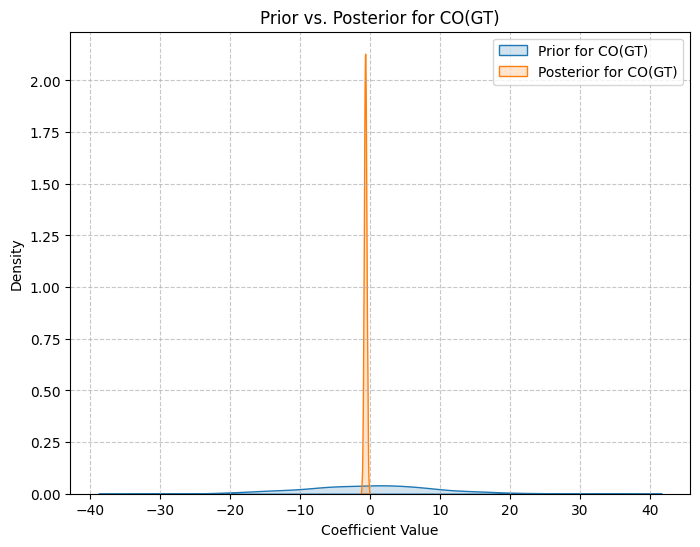

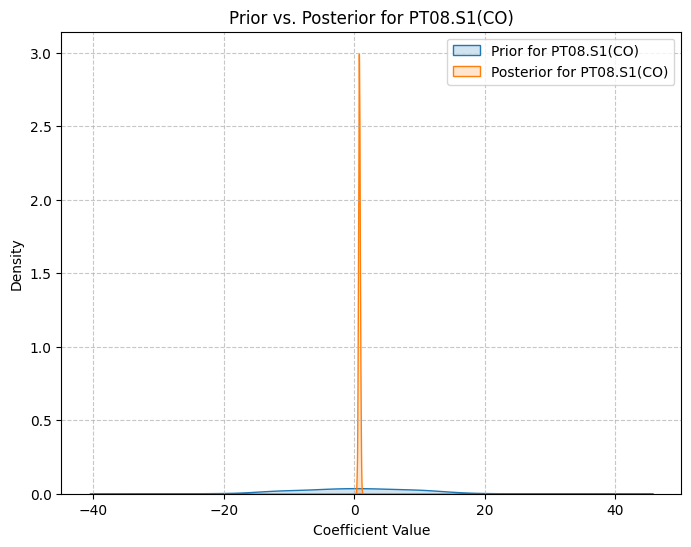

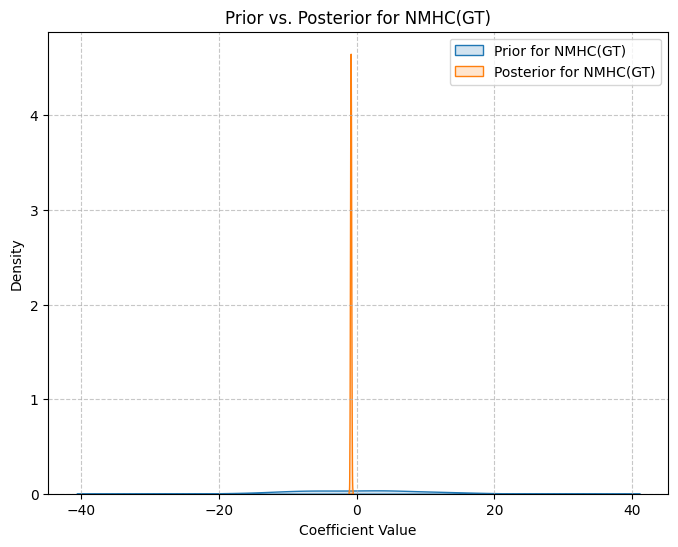

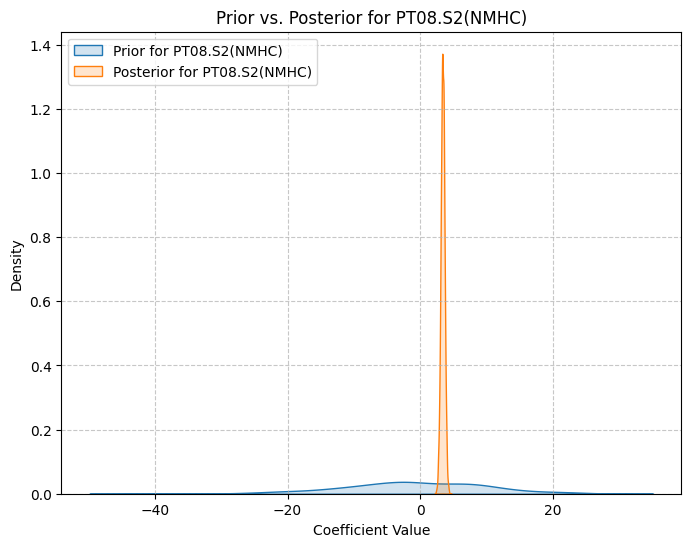

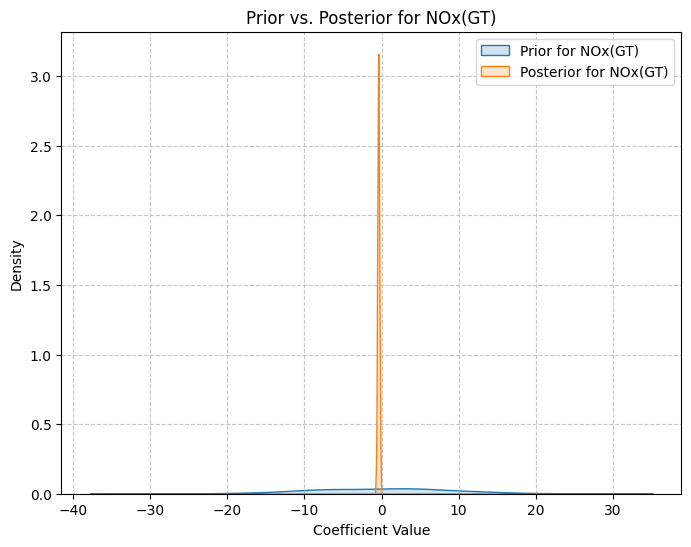

...

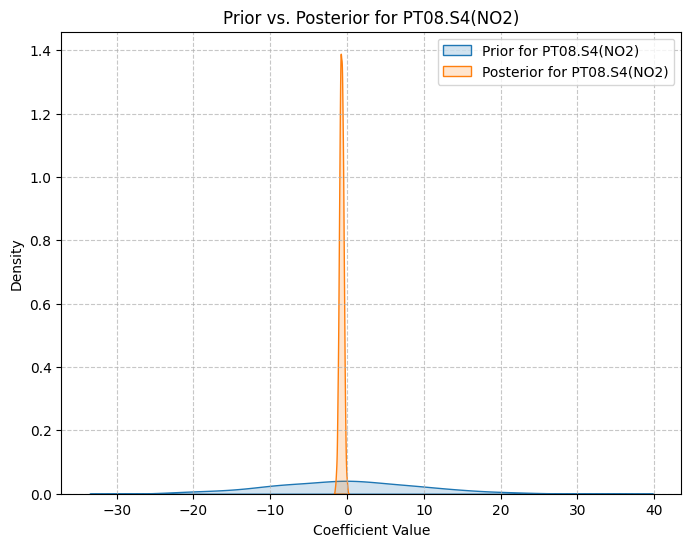

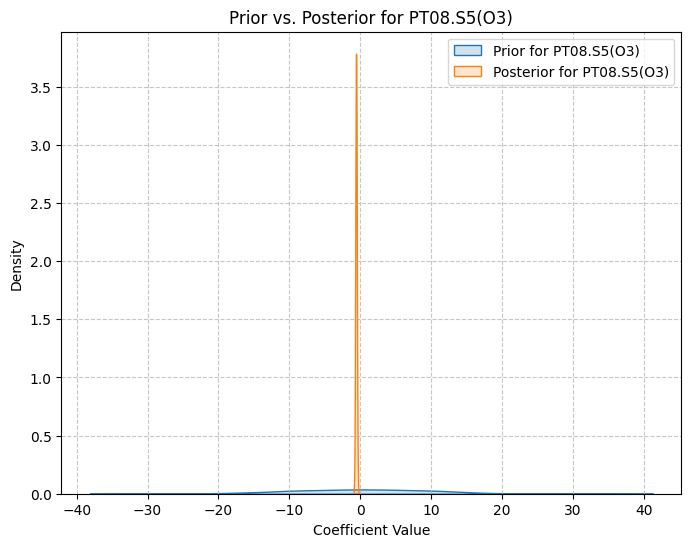

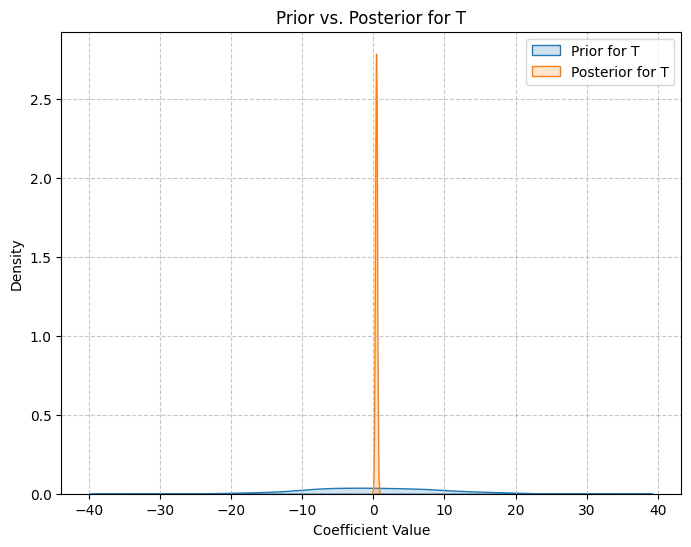

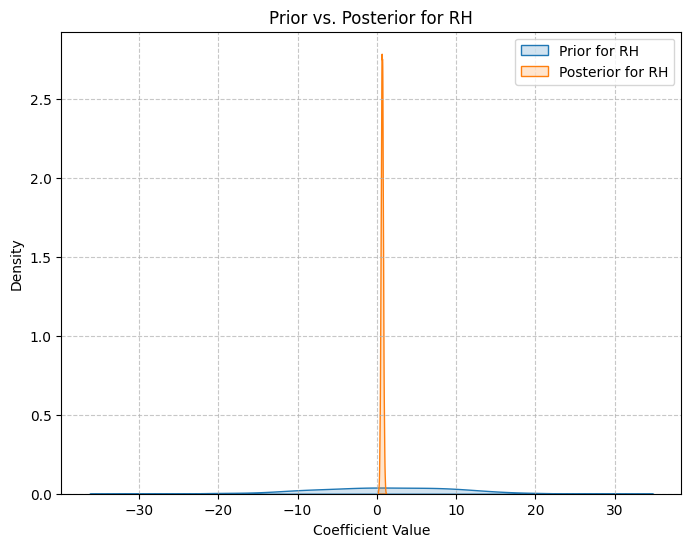

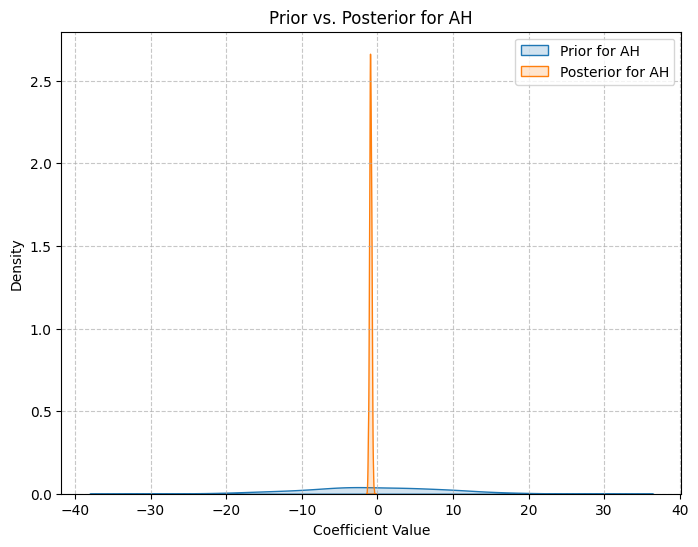

In [30]:
for i, predictor_name in enumerate(predictor_variables):
    # for posterior_gamma_beta in posterior_gamma_beta_values:
    # Extract prior and posterior for each predictor
    prior_samples = prior_gamma_beta_values[:, i]
    posterior_samples = idata.posterior["beta"].sel(beta_dim_0=i).values.flatten()
    # posterior_samples = idata.posterior["beta"].values.reshape((-1, idata.posterior["beta"].values.shape[1], idata.posterior["beta"].values.shape[2]))
    #idata.posterior["beta"].sel(beta_dim_0=i)#.values.flatten() #posterior_gamma_beta_values#
    # gamma_beta_posterior.sel(beta_dim_0=i).values.flatten()

    # Plot prior vs. posterior
    plt.figure(figsize=(8, 6))#(8, 6)
    # plt.hist(prior_samples, bins=100, density=True, alpha=0.5, label=f"Prior for {predictor_name}")
    # plt.hist(posterior_samples, bins=100, density=True, alpha=0.5, label=f"Posterior for {predictor_name}")
    sns.kdeplot(prior_samples, fill=True, alpha=0.2, label=f"Prior for {predictor_name}")
    sns.kdeplot(posterior_samples, fill=True, alpha=0.2, label=f"Posterior for {predictor_name}")
    plt.title(f"Prior vs. Posterior for {predictor_name}")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.show()


Gamma Model Evaluation

In [31]:
# with gamma_model:
#     #log_likelihood_gamma = 
#     pm.compute_log_likelihood(idata)#, model=gamma_model

# from pymc.stats.log_density import compute_log_density
# idata = compute_log_density(
#                 idata,
#                 var_names=None,
#                 extend_inferencedata=True,
#                 model=gamma_model,
#                 kind="likelihood",
#                 sample_dims=("chain", "draw"),
#                 progressbar=True,
#                 compile_kwargs = None)


In [32]:
idata

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

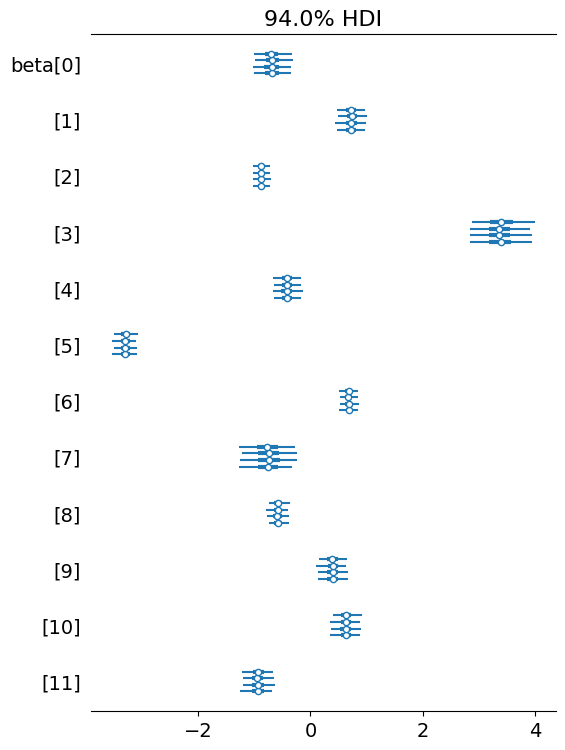

In [33]:
az.plot_forest(idata, var_names="beta");

In [34]:
# Compute WAIC and LOO for Model Comparison
# try:
# Compute WAIC
gamma_waic = az.waic(idata)#log_likelihood_gamma
print(f"WAIC: {gamma_waic}")

# Compute LOO
gamma_loo = az.loo(idata)#log_likelihood_gamma
print(f"LOO: {gamma_loo}")

# except Exception as e:
#     print("Error in computing WAIC/LOO:", str(e))

WAIC: Computed from 4000 posterior samples and 827 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  1698.26    58.41
p_waic       23.48        -

There has been a warning during the calculation. Please check the results.
LOO: Computed from 4000 posterior samples and 827 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  1697.78    58.72
p_loo       23.95        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      826   99.9%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    1    0.1%



In [35]:
# Extract Pareto k values
loo_result = az.loo(idata, pointwise=True)
pareto_k = loo_result.pareto_k.values

# Find the index of the problematic observation
problematic_index = np.where(pareto_k > 1)[0]
print(f"Problematic observation index: {problematic_index}")

Problematic observation index: [559]


In [37]:
y.iloc[550:570]

550    0.133763
551    0.073768
552    0.076277
553    0.063013
554    0.068315
555    0.029319
556    0.016689
557    0.037448
558    0.003963
559    0.001000
560    0.006186
561    0.011415
562    0.024645
563    0.043623
564    0.061991
565    0.088576
566    0.059865
567    0.023213
568    0.031498
569    0.080376
Name: C6H6(GT), dtype: float64

In [39]:
y.iloc[problematic_index]

559    0.001
Name: C6H6(GT), dtype: float64

Student t-model

Student t-model: Prior

In [46]:
# Define the Student-t model structure for prior sampling
with pm.Model() as student_t_model:
    # # Priors for coefficients, intercept, and degrees of freedom
    # beta = pm.Normal("beta", mu=0, sigma=10, shape=X.shape[1])  # Coefficients for predictors
    # intercept = pm.Normal("intercept", mu=0, sigma=10)  # Intercept
    # nu = pm.Exponential("nu", 1.0)  # Degrees of freedom (Student-t)

    # # Linear predictor
    # mu = pm.math.dot(X, beta) + intercept

    # # Likelihood (without observed data for prior predictive checks)
    # target = pm.StudentT("target", nu=nu, mu=mu, sigma=1.0)

    # # Sample from the prior predictive distribution
    # student_prior_predictive = pm.sample_prior_predictive()
    
    # Non-centered parameterization for numerical stability
    beta_raw = pm.Normal("beta_raw", mu=0, sigma=1, shape=X.shape[1])
    beta = pm.Deterministic("beta", beta_raw * 10)  # Scaling for interpretability

    intercept_raw = pm.Normal("intercept_raw", mu=0, sigma=1)
    intercept = pm.Deterministic("intercept", intercept_raw * 10)

    # Linear predictor
    mu = pm.math.dot(X.values, beta) + intercept  # No exponential, as Student-T supports negatives

    # Degrees of freedom (controls heavy tails)
    nu = pm.Exponential("nu", lam=1)  # Larger `nu` → Normal-like, smaller `nu` → heavy-tailed

    # Scale parameter (controls spread of distribution)
    sigma = pm.HalfNormal("sigma", sigma=10)  # Equivalent to `alpha` in Gamma

    # Likelihood: Student-T distribution (robust to outliers)
    target = pm.StudentT("target", nu=nu, mu=mu, sigma=sigma, observed=y.values)

    # Sample from prior predictive distribution
    prior_predictive = pm.sample_prior_predictive()


Sampling: [beta_raw, intercept_raw, nu, sigma, target]


In [47]:
student_prior_beta_shape = student_prior_predictive["prior"]["beta"].shape
student_prior_beta_shape

(1, 500, 12)

In [48]:
student_prior_beta_values = student_prior_predictive["prior"]["beta"].values.reshape(
    student_prior_beta_shape[1], student_prior_beta_shape[2])
student_prior_beta_values.shape

(500, 12)

In [49]:
student_prior_intercept = student_prior_predictive["prior"]["intercept"].values.flatten()

In [50]:
student_prior_nu = student_prior_predictive["prior"]["nu"].values.flatten()
type(student_prior_nu)

numpy.ndarray

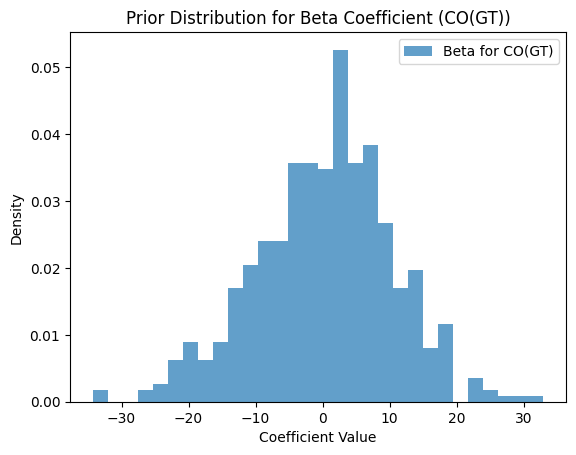

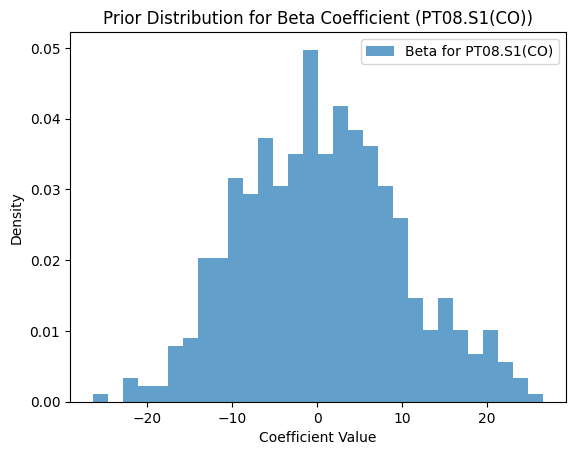

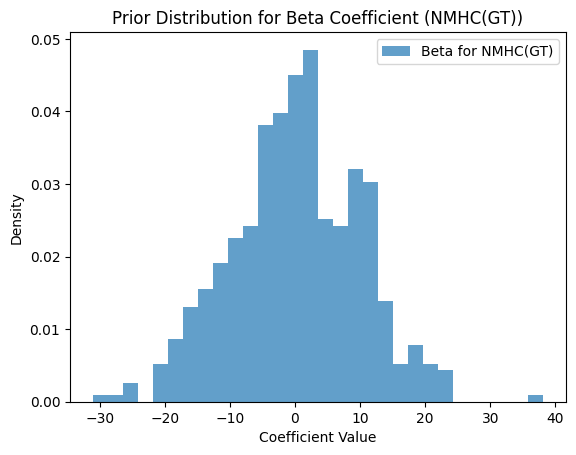

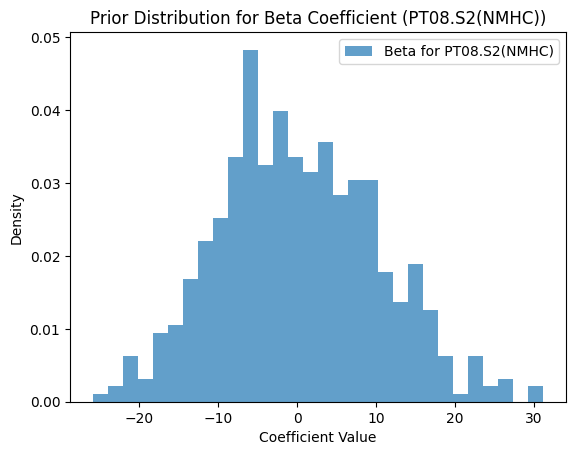

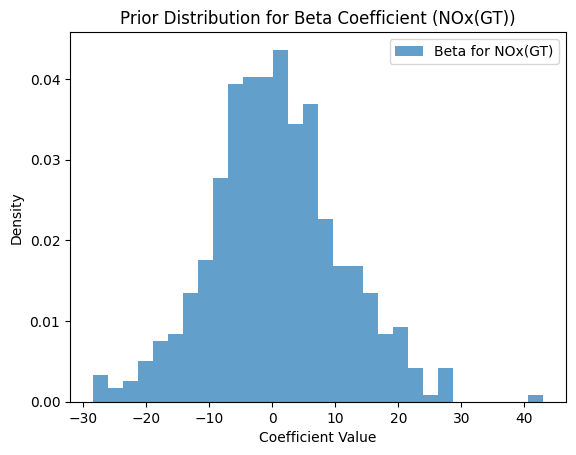

...

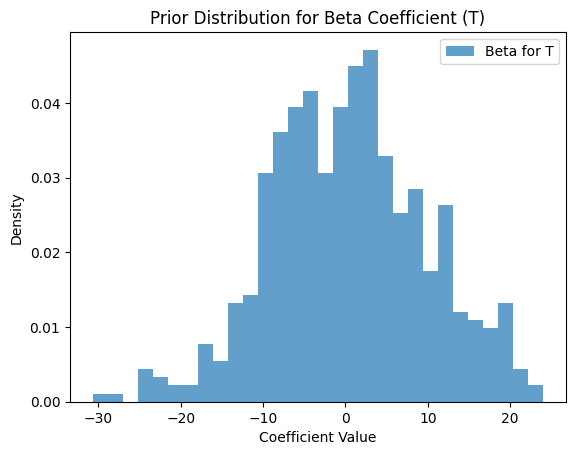

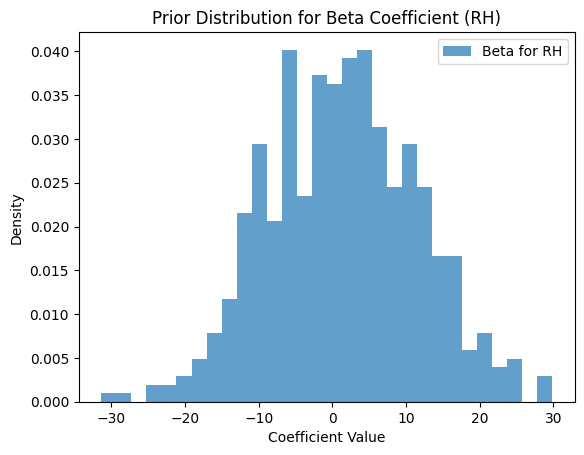

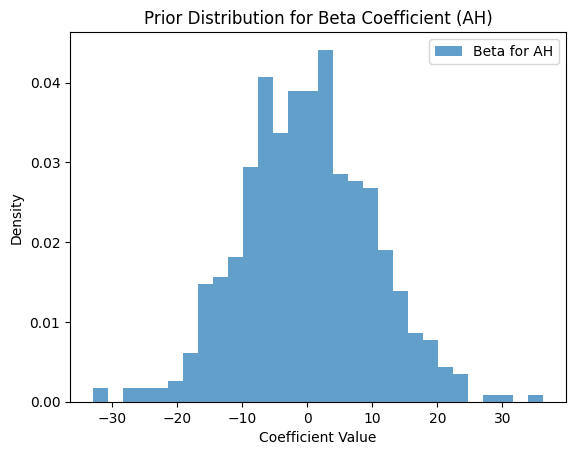

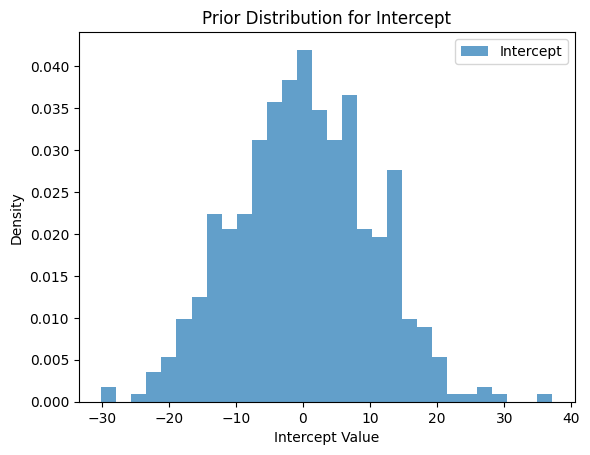

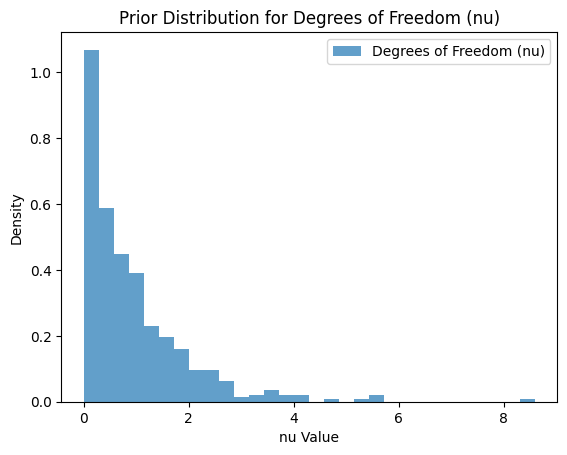

In [51]:
predictor_columns = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 
                    'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
# Plot prior for coefficients (beta)
for i, predictor in enumerate(predictor_columns):
    plt.hist(student_prior_beta_values[:, i], bins=30, density=True, alpha=0.7, label=f"Beta for {predictor}")
    plt.title(f"Prior Distribution for Beta Coefficient ({predictor})")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.show()

# Plot prior for intercept
plt.hist(student_prior_intercept, bins=30, density=True, alpha=0.7, label="Intercept")
plt.title("Prior Distribution for Intercept")
plt.xlabel("Intercept Value")
plt.ylabel("Density")
plt.legend()
plt.show()

# Plot prior for degrees of freedom (nu)
plt.hist(student_prior_nu, bins=30, density=True, alpha=0.7, label="Degrees of Freedom (nu)")
plt.title("Prior Distribution for Degrees of Freedom (nu)")
plt.xlabel("nu Value")
plt.ylabel("Density")
plt.legend()
plt.show()


In [53]:
with student_t_model:
    # beta = pm.Normal("beta", mu=0, sigma=10, shape=X.shape[1])
    # intercept = pm.Normal("intercept", mu=0, sigma=10)
    # nu = pm.Exponential("nu", 1.0)  # Degrees of freedom
    # mu = pm.math.dot(X, beta) + intercept
    # target = pm.StudentT("target", nu=nu, mu=mu, sigma=1.0, observed=y)
    # trace_student_t = pm.sample(500, tune=500, return_inferencedata=True)
    # student_posterior_predictive = pm.sample_posterior_predictive(trace_student_t, model=student_t_model)
    
    # Initialize model with a custom start point
    initial_point = student_t_model.initial_point()
    
    # Sampling with NUTS
    trace_student_t = pm.sample(
        1000, 
        tune=1000, 
        init="adapt_diag", 
        chains=4, 
        target_accept=0.9, 
        max_treedepth=15, 
        start=initial_point, 
        idata_kwargs={'log_likelihood': True}
    )


Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 3 jobs)
NUTS: [beta_raw, intercept_raw, nu, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 138 seconds.


In [54]:
student_posterior_predictive = pm.sample_posterior_predictive(trace_student_t, model=student_t_model)

Sampling: [target]


Output()

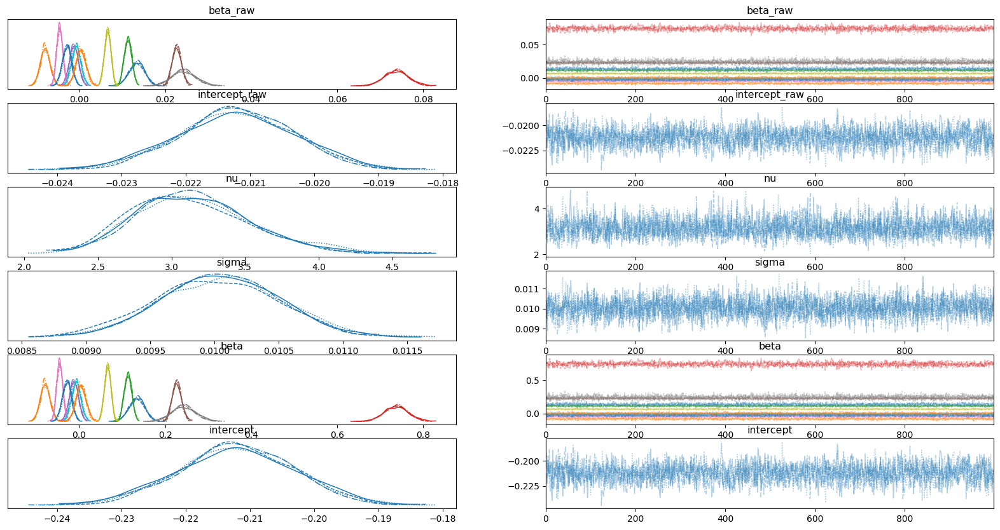

In [55]:
# Save and display posterior diagnostics
# posterior_summary = az.summary(student_t_summary)
az.plot_trace(trace_student_t, figsize=(20, 10), compact=True) #, var_names=scaled_data.columns
# plt.savefig("traceplot_beta_intercept_alpha.png")
plt.show()

In [56]:
trace_student_t

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

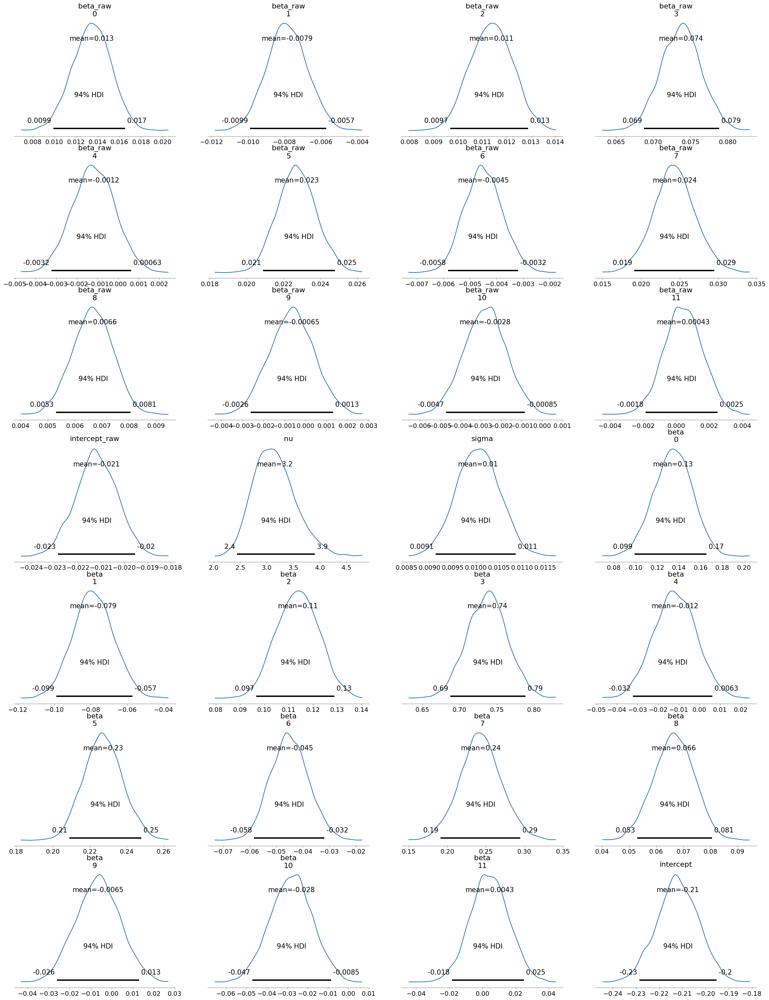

In [57]:
az.plot_posterior(trace_student_t.posterior)
# plt.savefig("posterior_beta_intercept_alpha.png")
plt.show()

In [58]:
student_beta_posterior = trace_student_t.posterior["beta"]

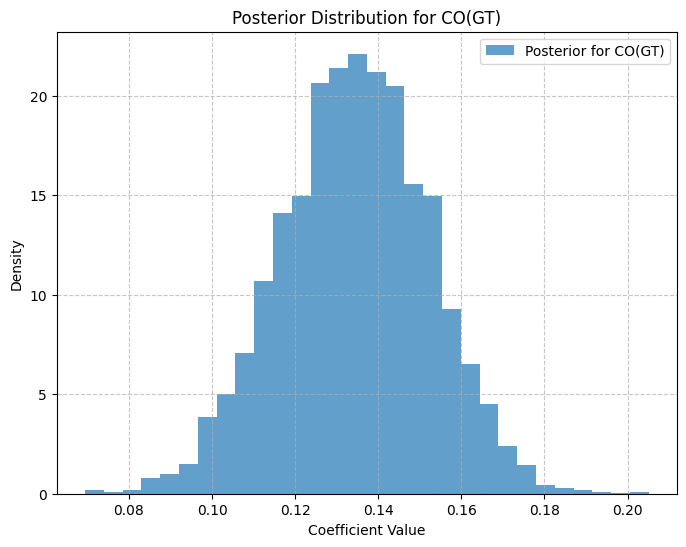

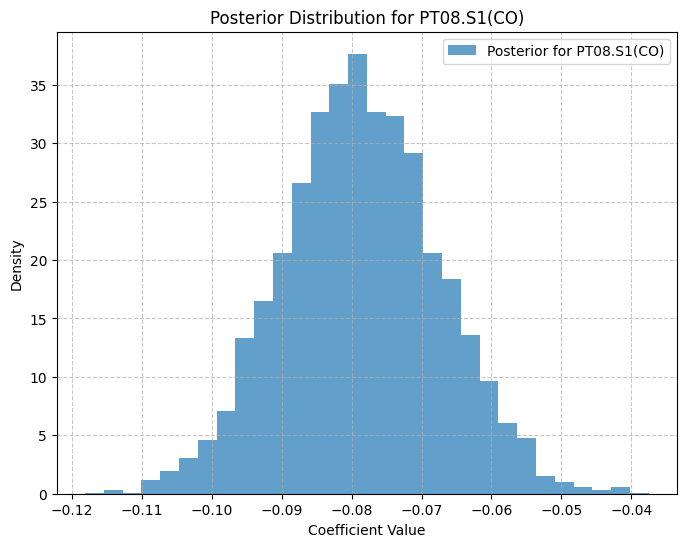

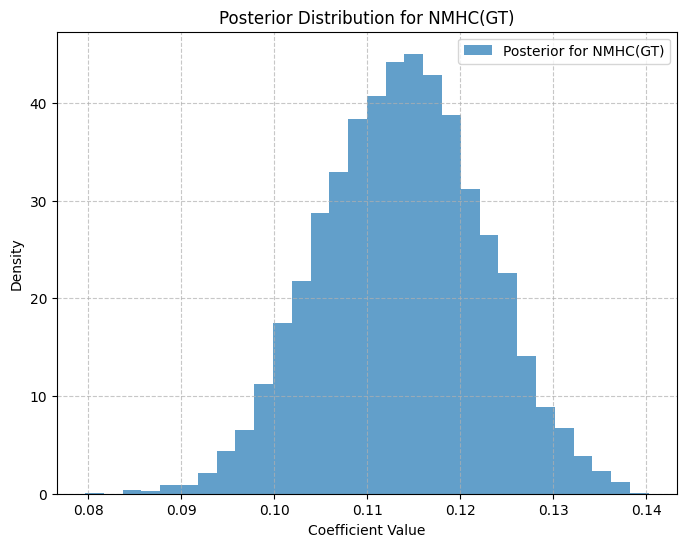

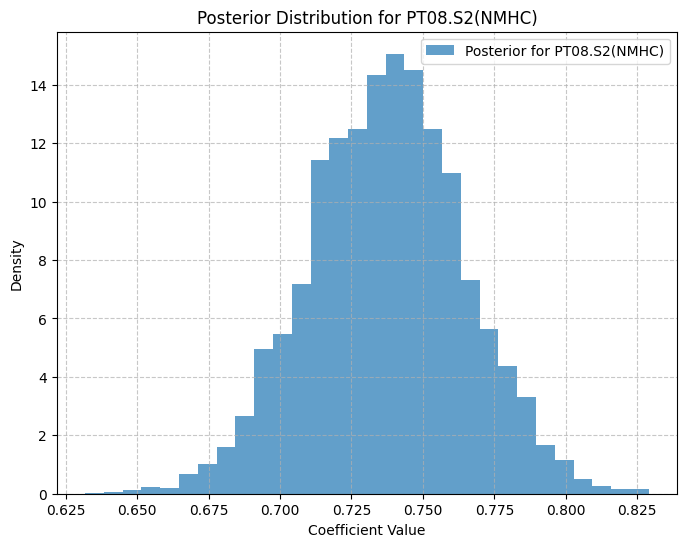

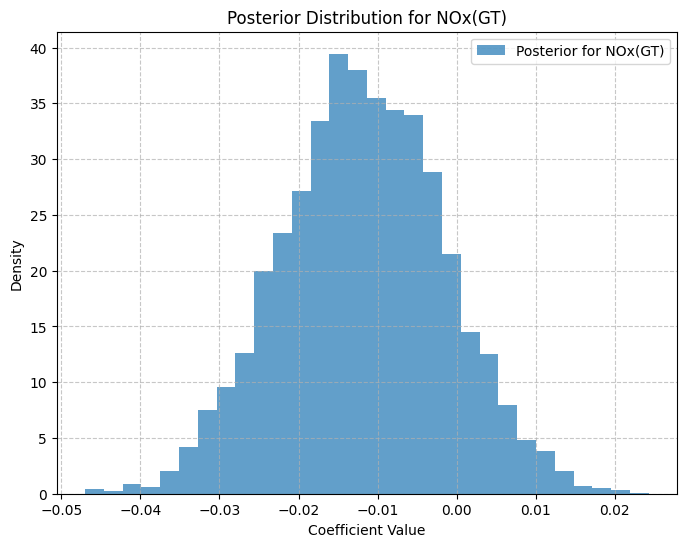

...

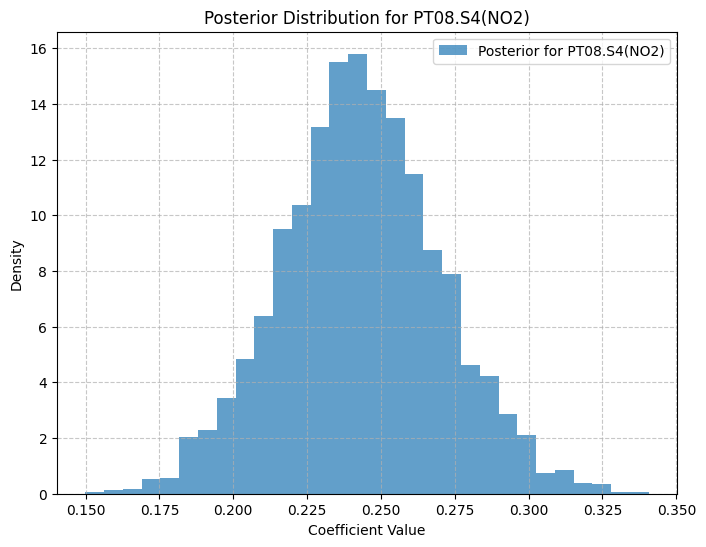

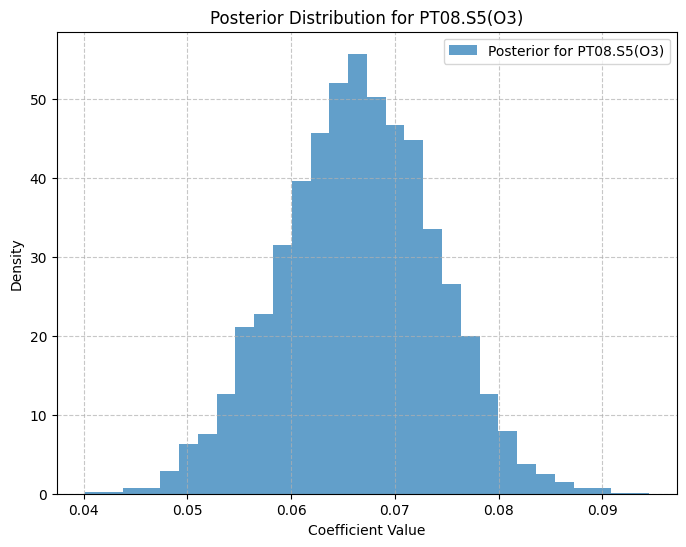

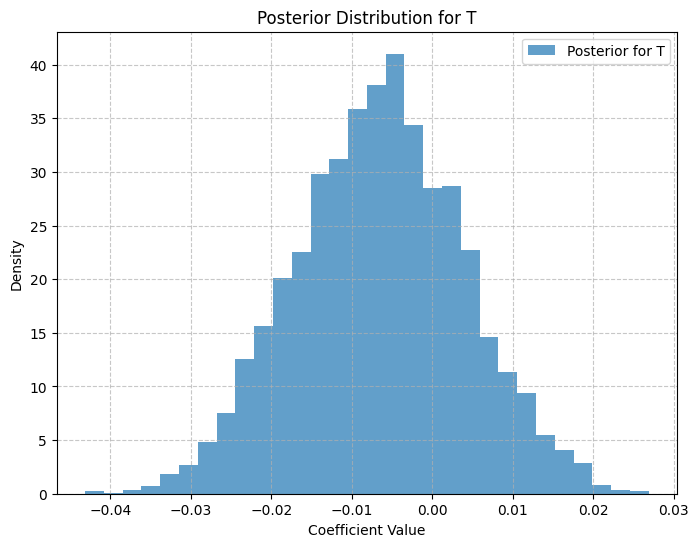

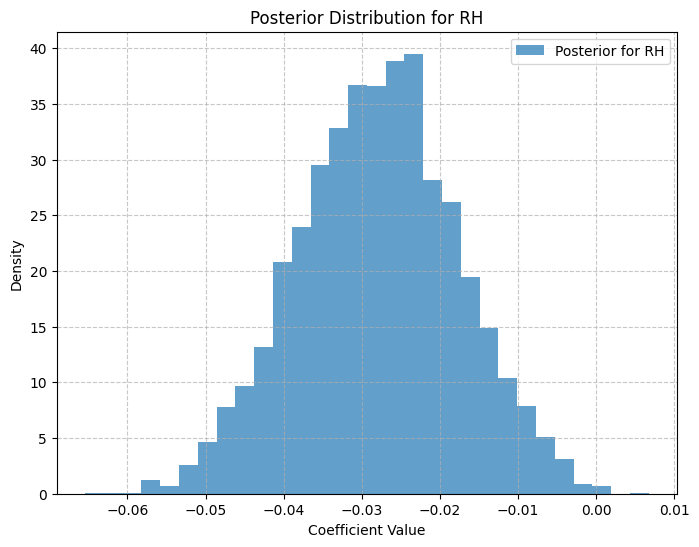

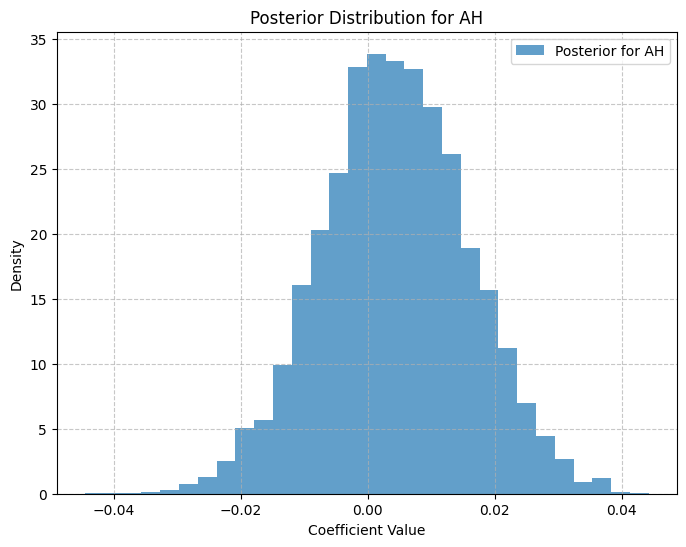

In [59]:
# Iterate through predictors and plot their posterior distributions
for i, predictor in enumerate(predictor_variables):
    # Extract posterior samples for the i-th predictor
    student_beta_predictor_posterior = student_beta_posterior.sel(beta_dim_0=i).values.flatten()  # Convert to NumPy array

    # Plot the posterior distribution
    plt.figure(figsize=(8, 6))
    plt.hist(student_beta_predictor_posterior, bins=30, density=True, alpha=0.7, label=f"Posterior for {predictor}")
    plt.title(f"Posterior Distribution for {predictor}")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.show()

In [60]:
# Summarize the posterior
# 95% credible interval
student_posterior_summary = az.summary(trace_student_t, var_names=["beta"], hdi_prob=0.95)
print(student_posterior_summary)

           mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]   0.134  0.018     0.099      0.167      0.000      0.0    2435.0   
beta[1]  -0.079  0.011    -0.099     -0.056      0.000      0.0    3090.0   
beta[2]   0.114  0.009     0.097      0.130      0.000      0.0    3407.0   
beta[3]   0.737  0.027     0.684      0.789      0.001      0.0    1668.0   
beta[4]  -0.012  0.010    -0.033      0.007      0.000      0.0    3603.0   
beta[5]   0.227  0.010     0.207      0.247      0.000      0.0    1935.0   
beta[6]  -0.045  0.007    -0.058     -0.031      0.000      0.0    3839.0   
beta[7]   0.243  0.027     0.191      0.299      0.001      0.0    1958.0   
beta[8]   0.066  0.007     0.053      0.082      0.000      0.0    3518.0   
beta[9]  -0.007  0.010    -0.027      0.014      0.000      0.0    1625.0   
beta[10] -0.028  0.010    -0.047     -0.007      0.000      0.0    1837.0   
beta[11]  0.004  0.012    -0.019      0.027      0.000      0.0    1499.0   

In [61]:
print("Student-t Posterior Summary:")

student_posterior_summary

Student-t Posterior Summary:


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[0],0.134,0.018,0.099,0.167,0.000,0.0,2435.0,2837.0,1.0
beta[1],-0.079,0.011,-0.099,-0.056,0.000,0.0,3090.0,3024.0,1.0
beta[2],0.114,0.009,0.097,0.130,0.000,0.0,3407.0,2835.0,1.0
beta[3],0.737,0.027,0.684,0.789,0.001,0.0,1668.0,2209.0,1.0
beta[4],-0.012,0.010,-0.033,0.007,0.000,0.0,3603.0,2979.0,1.0
beta[5],0.227,0.010,0.207,0.247,0.000,0.0,1935.0,2016.0,1.0
beta[6],-0.045,0.007,-0.058,-0.031,0.000,0.0,3839.0,3030.0,1.0
beta[7],0.243,0.027,0.191,0.299,0.001,0.0,1958.0,2749.0,1.0
beta[8],0.066,0.007,0.053,0.082,0.000,0.0,3518.0,2939.0,1.0
beta[9],-0.007,0.010,-0.027,0.014,0.000,0.0,1625.0,2368.0,1.0


In [62]:
student_prior_beta_values

array([[  3.52143107,  -2.69398785,   4.14629507, ...,  -9.21518107,
         -0.06599196,  -6.88268762],
       [ -8.19515575,   3.2113972 ,  -4.26451301, ..., -17.9888696 ,
          2.63910815,  14.28764949],
       [  6.73322322,   5.45033197,  -4.7694775 , ...,  -2.73191022,
          5.5540708 ,   8.01522149],
       ...,
       [-19.03230481,   4.65839862,  -3.67184038, ...,  -1.19952465,
          2.78145401,  -6.81519435],
       [ 12.60947755,  -6.55256046,   9.14026616, ...,   0.98292483,
         -3.35275193, -27.17939792],
       [-12.02319808,  -1.84138027,   9.61772899, ...,   2.00618626,
         -0.42740643,  -4.90590844]])

In [63]:
trace_student_t.posterior["beta"]

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 12)> Size: 384kB
array([[[ 1.04793485e-01, -4.80277481e-02,  1.13562423e-01, ...,
         -2.83484176e-02, -4.49451477e-02,  4.42526282e-03],
        [ 1.36971824e-01, -9.89810894e-02,  1.27800591e-01, ...,
          3.11192976e-03, -8.68660851e-03, -1.45492329e-04],
        [ 1.22471667e-01, -8.36785077e-02,  1.11744498e-01, ...,
         -1.09555781e-03, -2.18645654e-02,  5.38051210e-03],
        ...,
        [ 1.57272910e-01, -7.52689868e-02,  1.15946728e-01, ...,
          8.56749893e-03, -1.29315834e-02, -1.12445185e-02],
        [ 1.63669649e-01, -7.58032314e-02,  1.17819833e-01, ...,
          1.45894158e-02, -4.28951066e-03, -8.57335304e-03],
        [ 1.39712082e-01, -7.26317100e-02,  1.01828369e-01, ...,
          1.39009563e-02, -9.78451933e-03, -2.53653709e-02]],

       [[ 1.58752789e-01, -9.82242105e-02,  1.09722348e-01, ...,
         -4.83915317e-03, -2.18948476e-02,  1.76366807e-03],
        [ 1.44399931e-01, -6.49864887e-02,  1.03881958e-01, ...,
         -1.87292806e-02, -4.95057036e-02,  9.56486645e-03],
        [ 1.37502510e-01, -6.03495088e-02,  1.05796242e-01, ...,
         -1.81257202e-02, -3.96611978e-02,  7.26442503e-03],
...
        [ 1.46277658e-01, -9.06893315e-02,  1.03617507e-01, ...,
         -3.04436494e-02, -4.53909902e-02,  2.72168386e-02],
        [ 1.30260341e-01, -6.53210906e-02,  1.18594894e-01, ...,
          1.78114823e-02, -6.23373254e-03, -2.21080749e-02],
        [ 1.14984584e-01, -7.79023807e-02,  1.24693941e-01, ...,
         -2.11425008e-03, -2.63047563e-02, -9.90815604e-03]],

       [[ 1.31149592e-01, -6.87668197e-02,  1.11288283e-01, ...,
         -4.18349412e-02, -6.25912219e-02,  4.42717306e-02],
        [ 1.26515256e-01, -7.79301626e-02,  1.11347761e-01, ...,
         -3.68065400e-02, -5.72355686e-02,  3.51822121e-02],
        [ 1.28074143e-01, -7.87235678e-02,  1.12989821e-01, ...,
         -3.75066806e-02, -6.05140598e-02,  3.98239413e-02],
        ...,
        [ 1.35019022e-01, -6.76605154e-02,  1.17187007e-01, ...,
         -2.60049171e-02, -4.41486433e-02,  1.44638670e-02],
        [ 1.27029404e-01, -6.16224736e-02,  1.19575484e-01, ...,
         -2.26205365e-02, -4.09177958e-02,  1.91262804e-02],
        [ 1.30335624e-01, -6.85140758e-02,  1.17453618e-01, ...,
         -9.63393364e-03, -3.08928173e-02,  7.49768681e-03]]])
Coordinates:
  * chain       (chain) int32 16B 0 1 2 3
  * draw        (draw) int32 4kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
  * beta_dim_0  (beta_dim_0) int32 48B 0 1 2 3 4 5 6 7 8 9 10 11

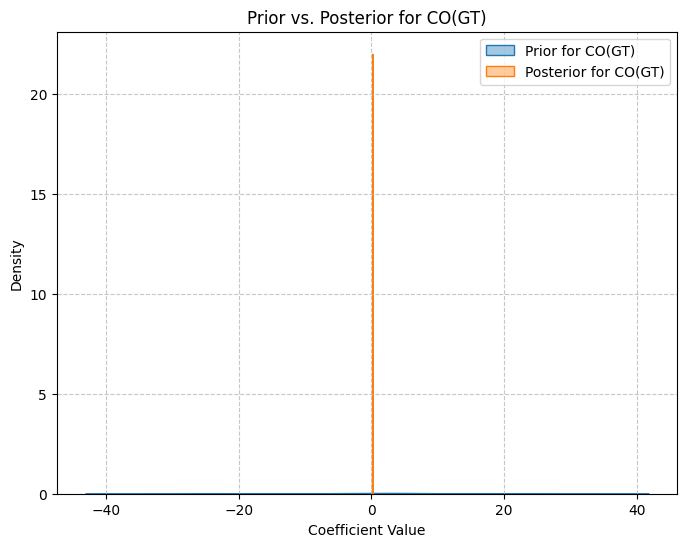

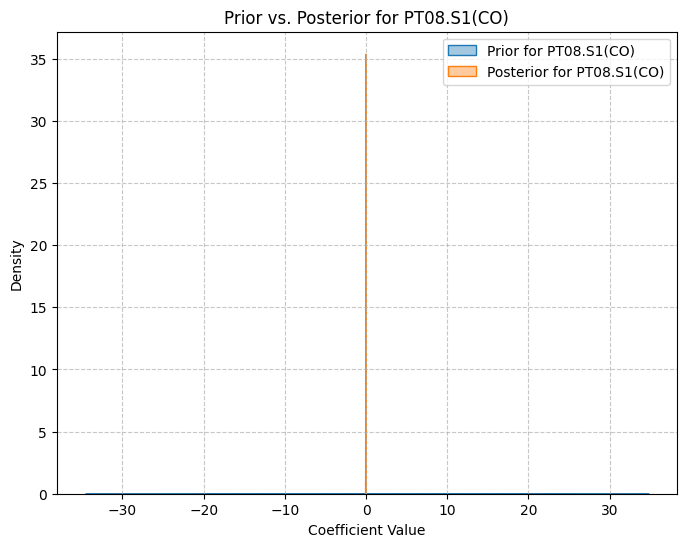

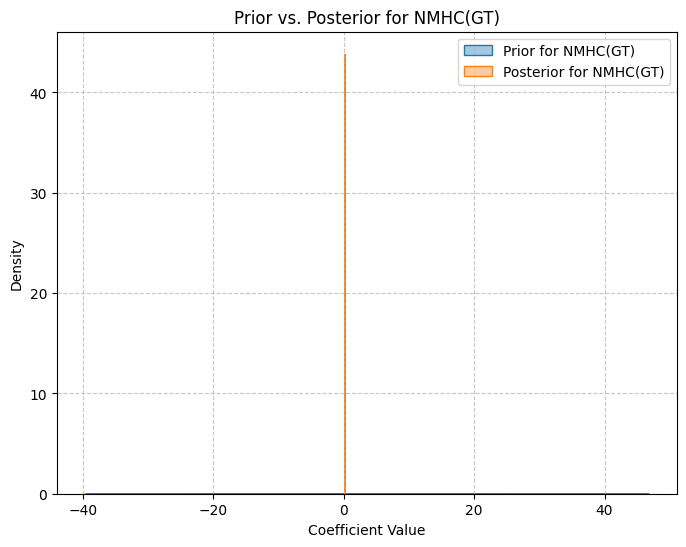

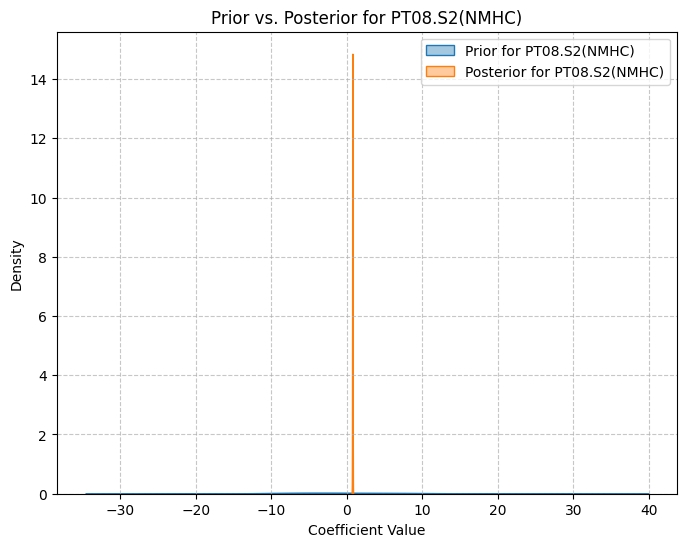

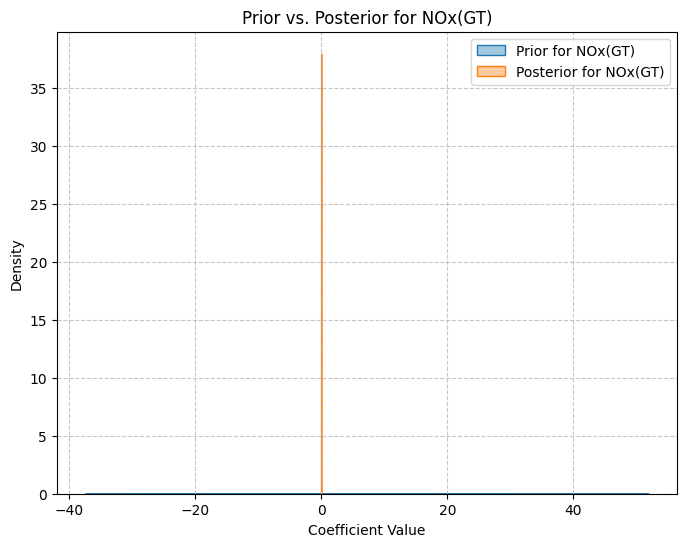

...

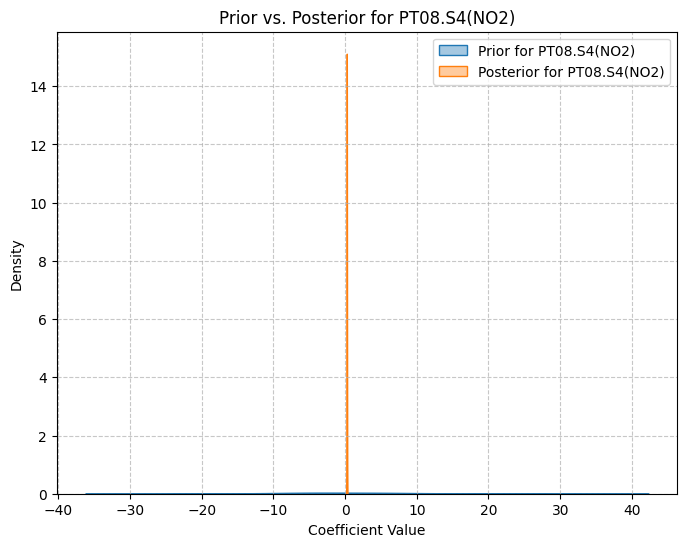

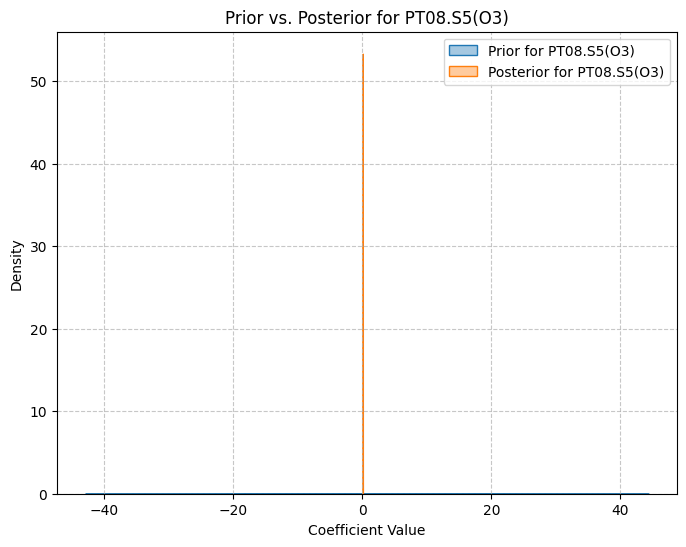

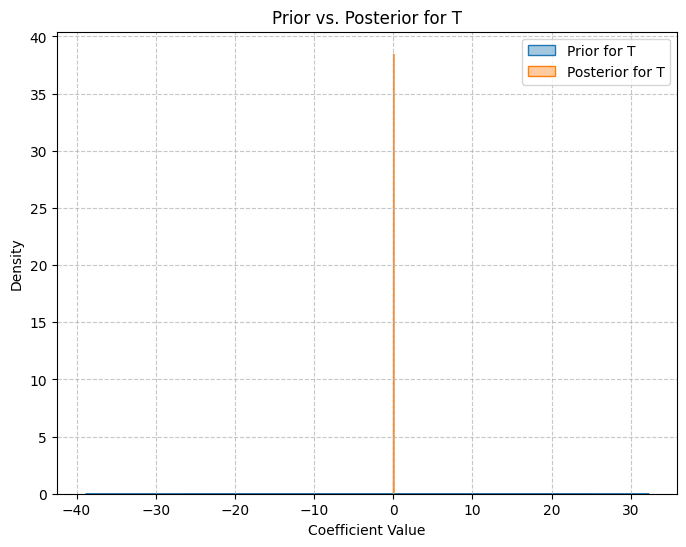

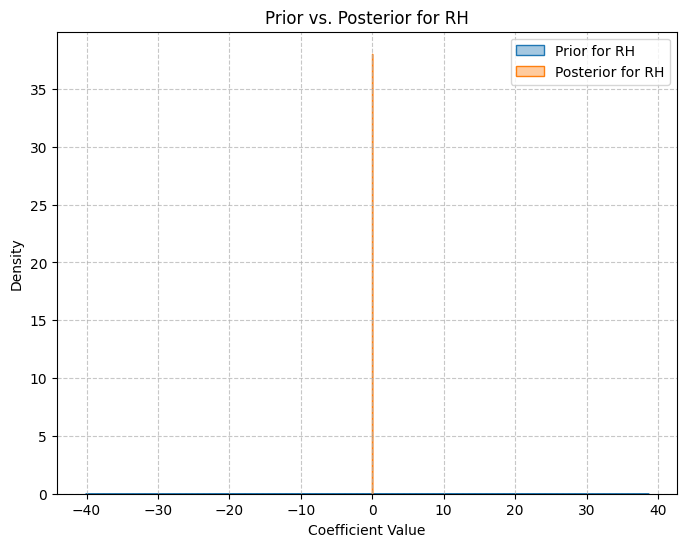

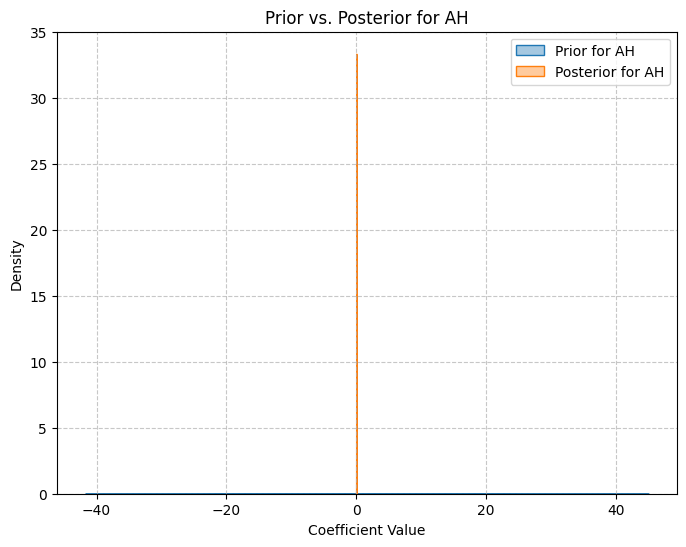

In [64]:
for i, predictor_name in enumerate(predictor_variables):
    # for posterior_gamma_beta in posterior_gamma_beta_values:
    # Extract prior and posterior for each predictor
    prior_samples = student_prior_beta_values[:, i]
    posterior_samples = trace_student_t.posterior["beta"].sel(beta_dim_0=i).values.flatten()
    # posterior_samples = idata.posterior["beta"].values.reshape((-1, idata.posterior["beta"].values.shape[1], idata.posterior["beta"].values.shape[2]))
    #idata.posterior["beta"].sel(beta_dim_0=i)#.values.flatten() #posterior_gamma_beta_values#
    # gamma_beta_posterior.sel(beta_dim_0=i).values.flatten()

    # Plot prior vs. posterior
    plt.figure(figsize=(8, 6))#(8, 6)
    # plt.hist(prior_samples, bins=100, density=True, alpha=0.5, label=f"Prior for {predictor_name}")
    # plt.hist(posterior_samples, bins=100, density=True, alpha=0.5, label=f"Posterior for {predictor_name}")
    sns.kdeplot(prior_samples, fill=True, alpha=0.4, label=f"Prior for {predictor_name}")
    sns.kdeplot(posterior_samples, fill=True, alpha=0.4, label=f"Posterior for {predictor_name}")
    plt.title(f"Prior vs. Posterior for {predictor_name}")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.show()


Student-t Model Evaluation

In [66]:
# with student_t_model:
#     # log_likelihood_gamma = 
#     pm.compute_log_likelihood(trace_student_t)

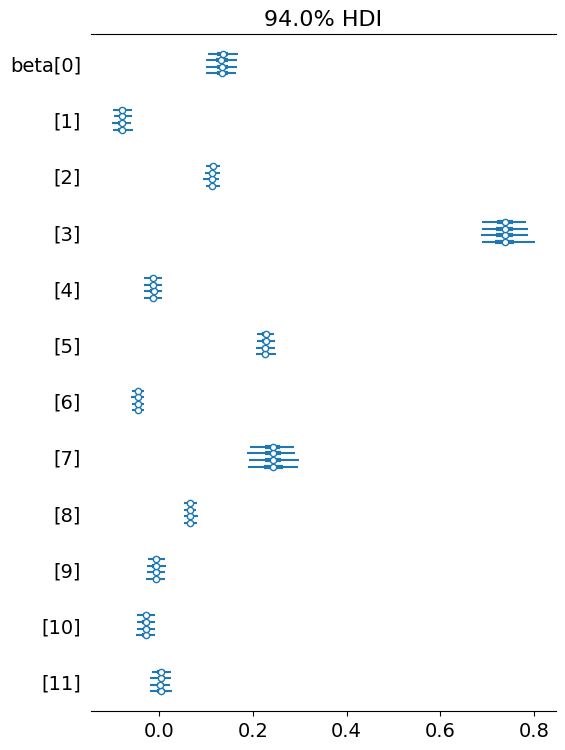

In [67]:
az.plot_forest(trace_student_t, var_names="beta");

In [68]:
# Compute WAIC and LOO for Model Comparison
try:
    # Compute WAIC
    student_t_waic = az.waic(trace_student_t)
    print(f"WAIC: {student_t_waic}")

    # Compute LOO
    student_t_loo = az.loo(trace_student_t)
    print(f"LOO: {student_t_loo}")

except Exception as e:
    print("Error in computing WAIC/LOO:", str(e))

WAIC: Computed from 4000 posterior samples and 827 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  2341.91    31.14
p_waic       22.35        -
LOO: Computed from 4000 posterior samples and 827 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  2341.87    31.14
p_loo       22.38        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      827  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



Linear Model (Bayesian)

Linear Model Prior Check

In [82]:
# # Define predictors and target
# predictor_columns = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 
#                     'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']
# X = scaled_data[predictor_columns].values  # Predictors

# Bayesian Linear Regression - Prior Model
with pm.Model() as linear_model:
    # # Priors for coefficients and intercept
    # beta = pm.Normal("beta", mu=0, sigma=10, shape=X.shape[1])  # Coefficients for predictors
    # intercept = pm.Normal("intercept", mu=0, sigma=10)  # Intercept
    # sigma = pm.HalfCauchy("sigma", beta=2)  # Noise standard deviation

    # # Linear model
    # mu = pm.math.dot(X, beta) + intercept  # Linear predictor

    # # Likelihood (without observed data for prior predictive checks)
    # target = pm.Normal("target", mu=mu, sigma=sigma)

    # # Sample from the prior predictive distribution
    # linear_prior_model = pm.sample_prior_predictive()
    
    # Non-centered parameterization for stability
    beta_raw = pm.Normal("beta_raw", mu=0, sigma=1, shape=X.shape[1])
    beta = pm.Deterministic("beta", beta_raw * 10)  # Scaling for interpretability

    intercept_raw = pm.Normal("intercept_raw", mu=0, sigma=1)
    intercept = pm.Deterministic("intercept", intercept_raw * 10)

    # Linear predictor
    mu = pm.math.dot(X.values, beta) + intercept  # No exponential transformation

    # Standard deviation of residuals (controls spread of errors)
    sigma = pm.HalfNormal("sigma", sigma=10)  # Ensures positive variance

    # Likelihood: Normal (for continuous outcomes)
    target = pm.Normal("target", mu=mu, sigma=sigma, observed=y.values)

    # Sample from prior predictive distribution
    linear_prior_predictive = pm.sample_prior_predictive()

Sampling: [beta_raw, intercept_raw, sigma, target]


In [83]:
linear_prior_predictive

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [84]:
linear_prior_model_shape = linear_prior_predictive["prior"]["beta"].shape
linear_prior_model_shape

(1, 500, 12)

In [85]:
prior_linear_beta_values = linear_prior_predictive["prior"]["beta"].values.reshape(linear_prior_model_shape[1], linear_prior_model_shape[2])
prior_linear_beta_values.shape

(500, 12)

In [86]:
prior_linear_intercept = linear_prior_predictive["prior"]["intercept"].values.flatten()
type(prior_linear_intercept)

numpy.ndarray

In [87]:
prior_lienar_sigma = linear_prior_predictive["prior"]["sigma"].values.flatten()
type(prior_lienar_sigma)

numpy.ndarray

In [89]:
prior_lienar_target = linear_prior_predictive["observed_data"]["target"].values.flatten()
type(prior_lienar_target)

numpy.ndarray

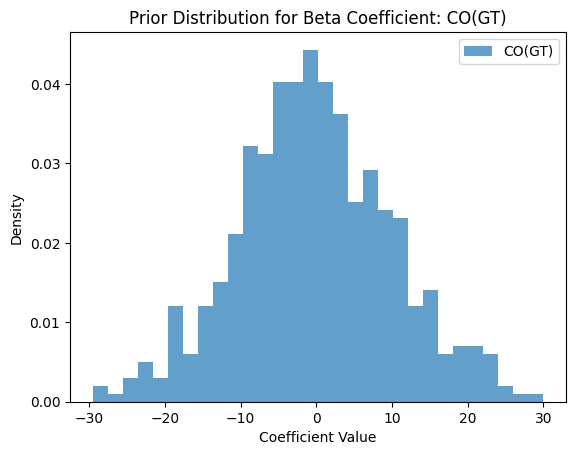

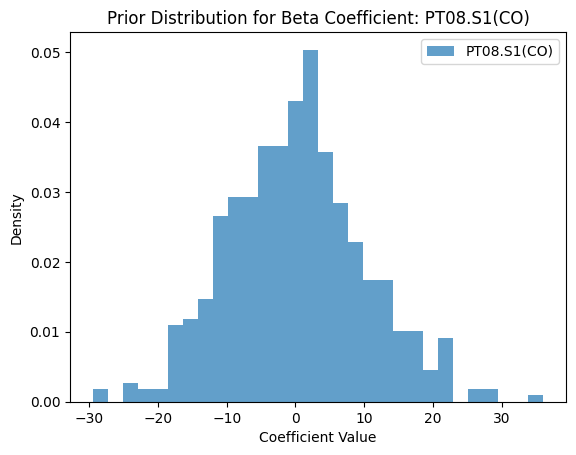

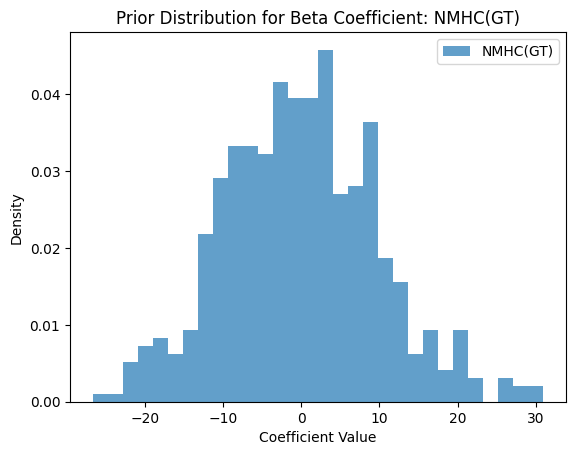

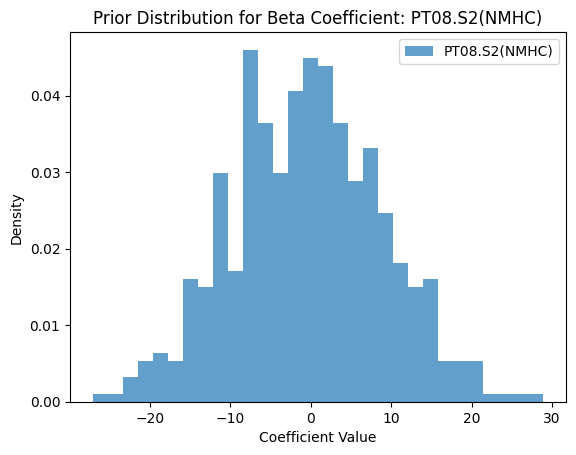

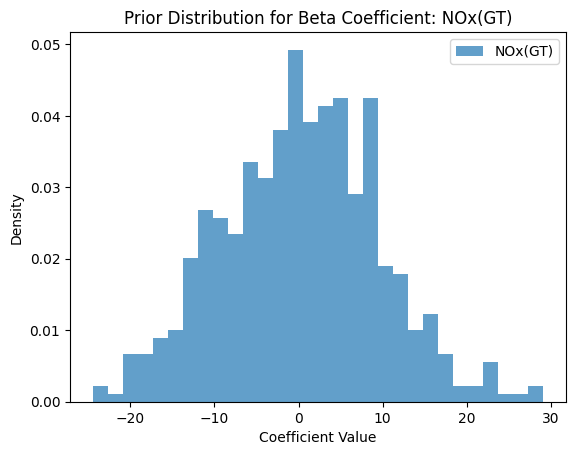

...

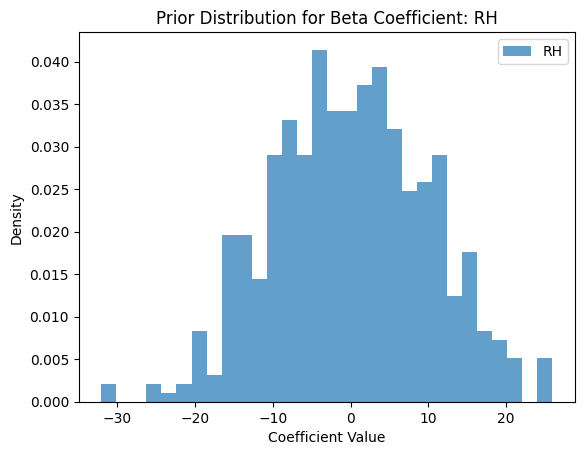

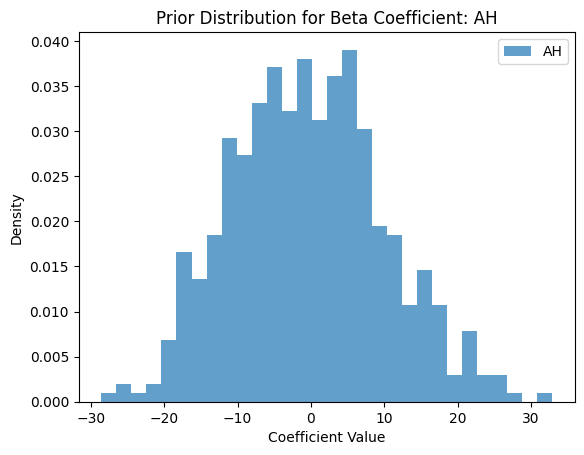

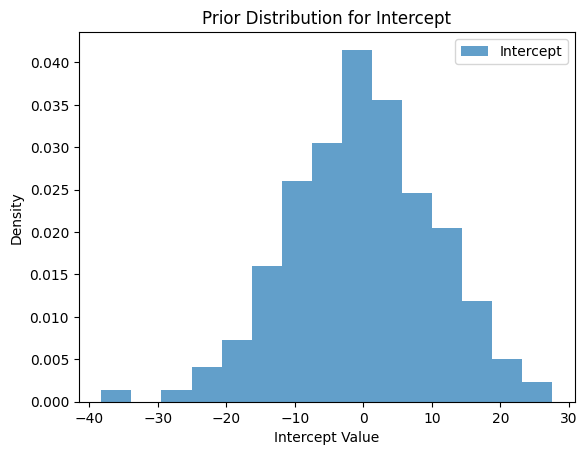

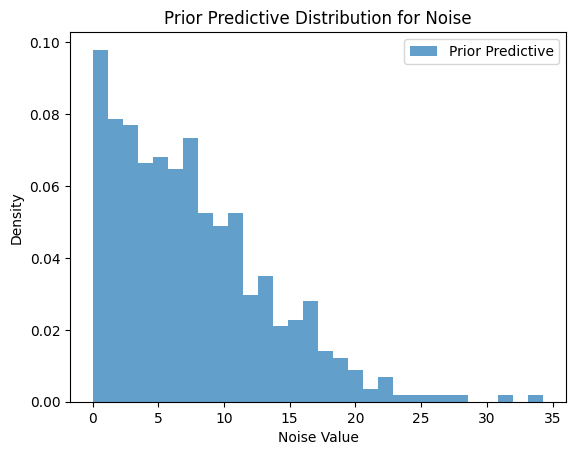

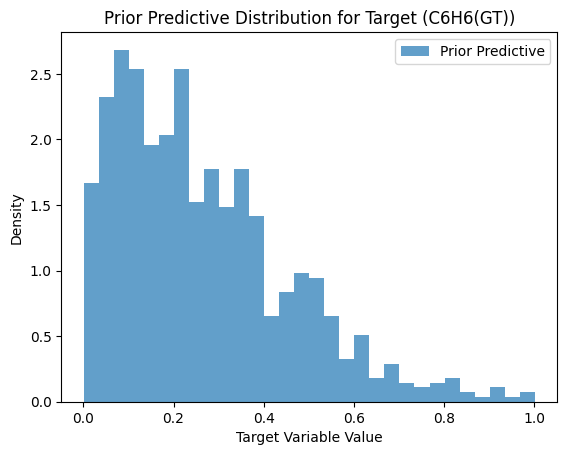

In [90]:
# Plot prior distributions for coefficients
for i, predictor in enumerate(predictor_columns):
    plt.hist(prior_linear_beta_values[:, i], bins=30, density=True, alpha=0.7, label=f"{predictor}")
    plt.title(f"Prior Distribution for Beta Coefficient: {predictor}")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.show()

# Plot prior for intercept
plt.hist(prior_linear_intercept, bins=15, density=True, alpha=0.7, label="Intercept")
plt.title("Prior Distribution for Intercept")
plt.xlabel("Intercept Value")
plt.ylabel("Density")
plt.legend()
plt.show()

# Plot prior predictive distribution of the target variable
plt.hist(prior_lienar_sigma, bins=30, density=True, alpha=0.7, label="Prior Predictive")
plt.title("Prior Predictive Distribution for Noise")
plt.xlabel("Noise Value")
plt.ylabel("Density")
plt.legend()
plt.show()

# Plot prior predictive distribution of the target variable
plt.hist(prior_lienar_target, bins=30, density=True, alpha=0.7, label="Prior Predictive")
plt.title("Prior Predictive Distribution for Target (C6H6(GT))")
plt.xlabel("Target Variable Value")
plt.ylabel("Density")
plt.legend()
plt.show()

Linear Model (Bayesian): Posterior Check

In [91]:
# Bayesian Linear Regression
with linear_model:
    # # Priors for coefficients and intercept
    # beta = pm.Normal("beta", mu=0, sigma=10, shape=X.shape[1])  # Coefficients for predictors
    # intercept = pm.Normal("intercept", mu=0, sigma=10)  # Intercept
    # sigma = pm.HalfCauchy("sigma", beta=2)  # Noise standard deviation

    # # Linear model
    # mu = pm.math.dot(X, beta) + intercept  # Linear predictor

    # # Likelihood
    # target = pm.Normal("target", mu=mu, sigma=sigma, observed=y)

    # # Sampling
    # linear_trace = pm.sample(500, tune=500, return_inferencedata=True)

    # # Posterior predictive checks
    # linear_posterior_predictive = pm.sample_posterior_predictive(linear_trace, model=linear_model)
    
    # Initialize model with a custom start point
    initial_point = linear_model.initial_point()
    
    # Sampling using NUTS
    linear_trace = pm.sample(
        1000, 
        tune=1000, 
        init="adapt_diag", 
        chains=4, 
        target_accept=0.9, 
        max_treedepth=15, 
        start=initial_point, 
        idata_kwargs={'log_likelihood': True}
    )


Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 3 jobs)
NUTS: [beta_raw, intercept_raw, sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 88 seconds.


In [92]:
linear_posterior_predictive = pm.sample_posterior_predictive(linear_trace, model=linear_model)

Sampling: [target]


Output()

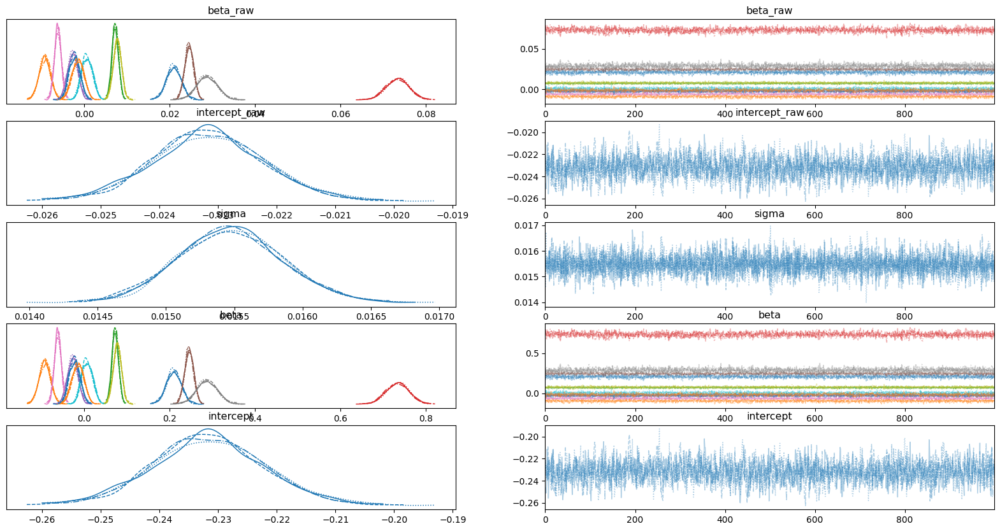

In [93]:
az.plot_trace(linear_trace, figsize=(20, 10), compact=True)
plt.show()

In [94]:
linear_trace

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

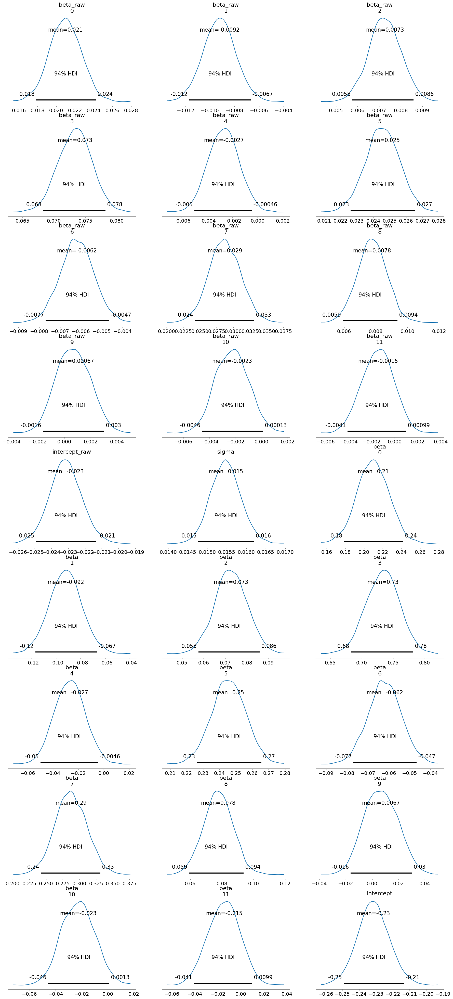

In [95]:
az.plot_posterior(linear_trace.posterior)
# plt.savefig("posterior_beta_intercept_alpha.png")
plt.show()

In [96]:
# Extract posterior samples for beta
linear_beta_posterior = linear_trace.posterior["beta"]
print(linear_beta_posterior)

<xarray.DataArray 'beta' (chain: 4, draw: 1000, beta_dim_0: 12)> Size: 384kB
array([[[ 2.03879280e-01, -8.41577678e-02,  7.69986072e-02, ...,
          4.79011550e-03, -1.61607719e-02, -6.64363748e-03],
        [ 1.97649733e-01, -8.41330078e-02,  8.07660376e-02, ...,
          1.72642534e-02,  6.45263297e-04, -3.09747324e-02],
        [ 2.30721388e-01, -8.83146736e-02,  7.42546486e-02, ...,
          3.27683362e-02,  6.43592737e-03, -3.19167135e-02],
        ...,
        [ 2.05306941e-01, -9.09373432e-02,  6.80763460e-02, ...,
         -2.52105325e-03, -3.24690190e-02, -7.68081465e-03],
        [ 1.93097228e-01, -9.01675145e-02,  8.27394633e-02, ...,
          1.29486274e-02, -1.64759005e-02, -1.59293163e-02],
        [ 2.14647991e-01, -9.05212368e-02,  6.70446261e-02, ...,
         -1.35947662e-03, -3.33782023e-02, -1.17581926e-02]],

       [[ 1.95430291e-01, -8.44612204e-02,  7.31855103e-02, ...,
          9.88499387e-03, -2.63307172e-02, -1.22106523e-02],
        [ 1.93637683e-01, 

In [97]:
linear_posterior_summary = az.summary(linear_trace, var_names=["beta"], hdi_prob=0.95)

print("Linear Posterior Summary:")
linear_posterior_summary

Linear Posterior Summary:


,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[0],0.210,0.017,0.179,0.246,0.000,0.0,2568.0,2347.0,1.0
beta[1],-0.092,0.013,-0.119,-0.067,0.000,0.0,3060.0,2737.0,1.0
beta[2],0.073,0.008,0.058,0.087,0.000,0.0,3710.0,3491.0,1.0
beta[3],0.733,0.026,0.684,0.787,0.001,0.0,2020.0,2311.0,1.0
beta[4],-0.027,0.012,-0.050,-0.002,0.000,0.0,3572.0,2701.0,1.0
beta[5],0.246,0.010,0.226,0.267,0.000,0.0,1893.0,2549.0,1.0
beta[6],-0.062,0.008,-0.078,-0.046,0.000,0.0,3358.0,2834.0,1.0
beta[7],0.287,0.024,0.241,0.335,0.000,0.0,2609.0,2709.0,1.0
beta[8],0.078,0.009,0.058,0.094,0.000,0.0,3581.0,2941.0,1.0
beta[9],0.007,0.013,-0.017,0.031,0.000,0.0,1554.0,2481.0,1.0


In [99]:
linear_prior_beta_shape = linear_prior_predictive["prior"]["beta"].shape
linear_prior_beta_shape

(1, 500, 12)

In [101]:
linear_prior_beta_values = linear_prior_predictive["prior"]["beta"].values.reshape(
    linear_prior_beta_shape[1], linear_prior_beta_shape[2])
linear_prior_beta_values.shape

(500, 12)

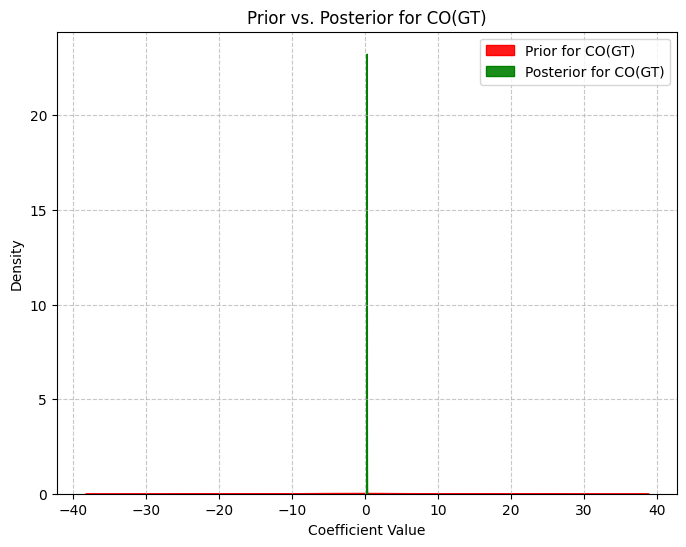

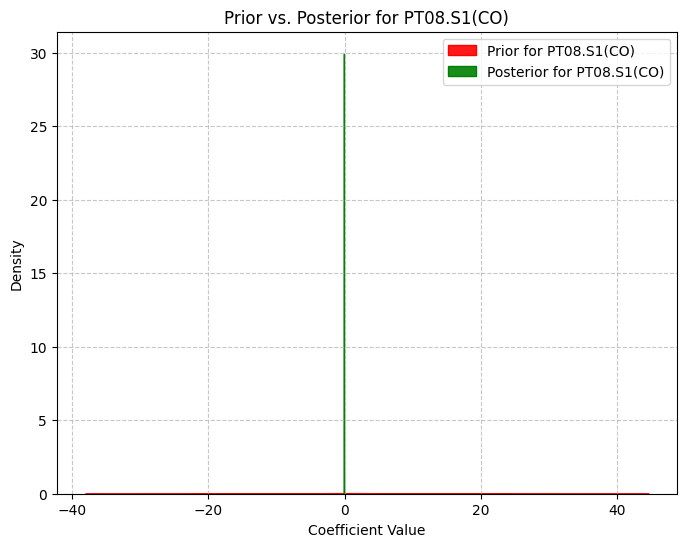

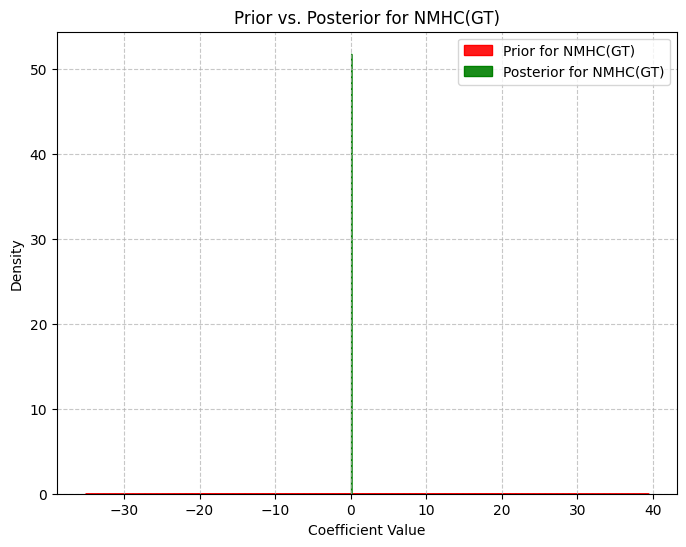

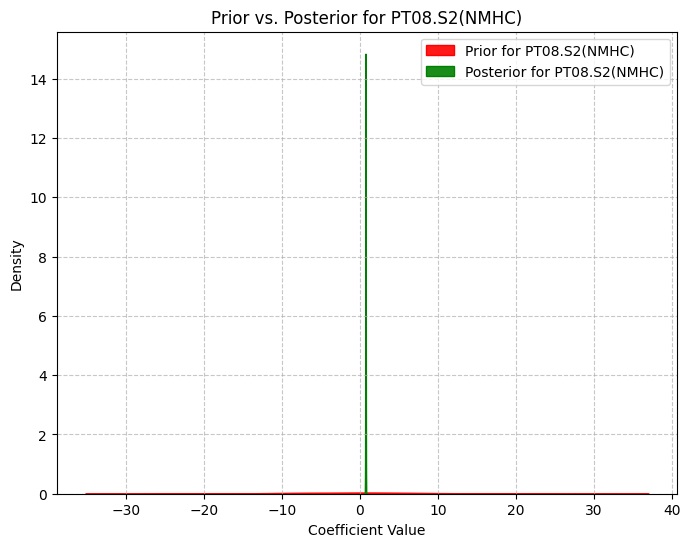

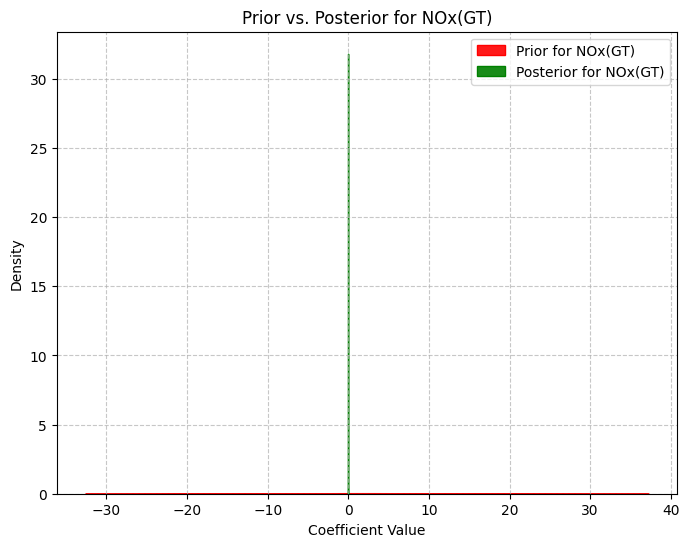

...

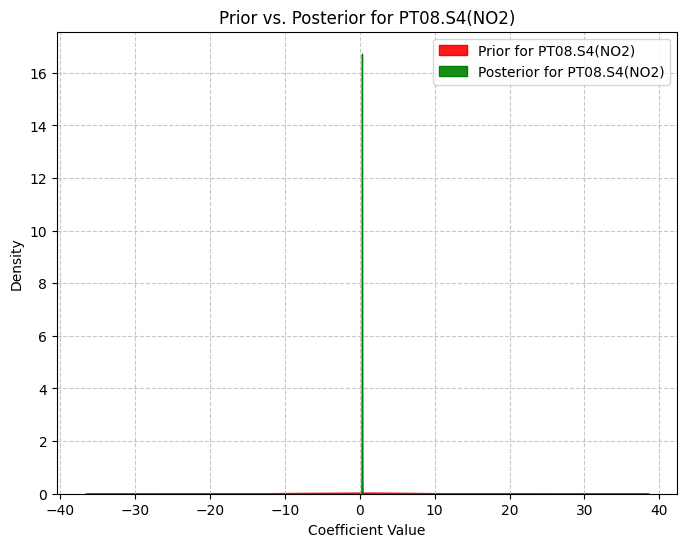

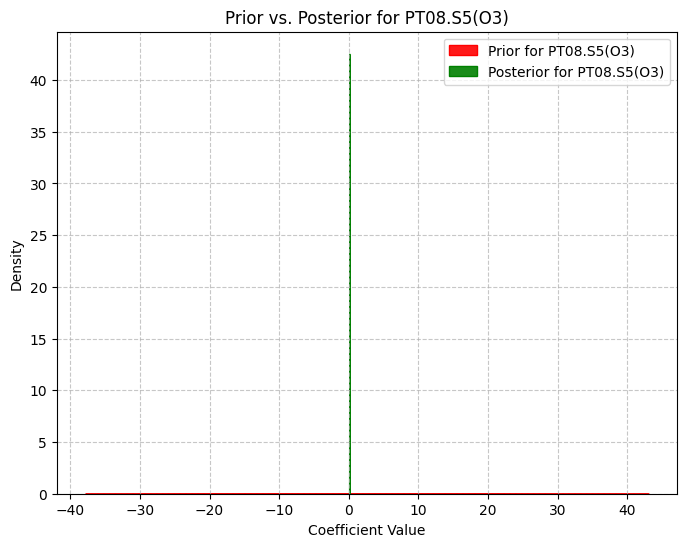

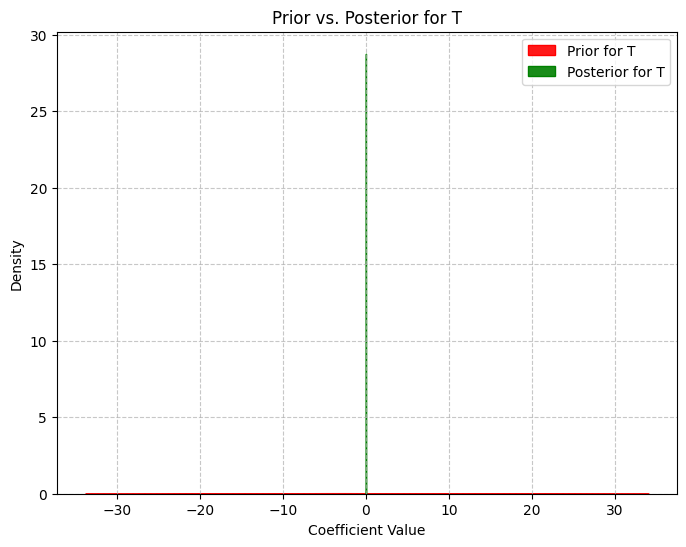

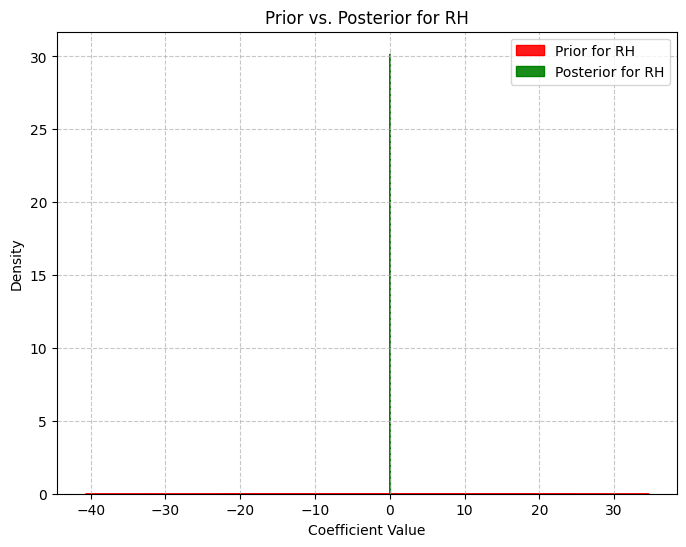

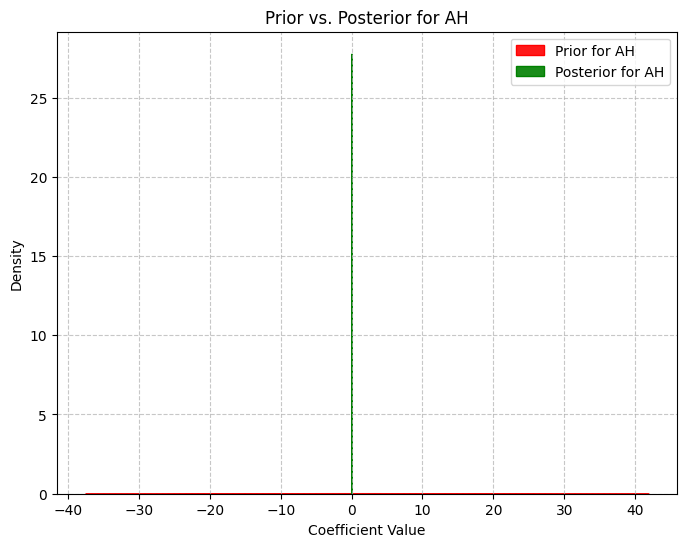

In [102]:
for i, predictor_name in enumerate(predictor_variables):
    # for posterior_gamma_beta in posterior_gamma_beta_values:
    # Extract prior and posterior for each predictor
    prior_samples = linear_prior_beta_values[:, i]
    posterior_samples = linear_trace.posterior["beta"].sel(beta_dim_0=i).values.flatten()

    # Plot prior vs. posterior
    plt.figure(figsize=(8, 6))#(8, 6)
    # plt.hist(prior_samples, bins=100, density=True, alpha=0.5, label=f"Prior for {predictor_name}")
    # plt.hist(posterior_samples, bins=100, density=True, alpha=0.5, label=f"Posterior for {predictor_name}")
    sns.kdeplot(prior_samples, fill=True, color="red", alpha=0.9, label=f"Prior for {predictor_name}")
    sns.kdeplot(posterior_samples, fill=True, color="green", alpha=0.9, label=f"Posterior for {predictor_name}")
    plt.title(f"Prior vs. Posterior for {predictor_name}")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.show()


Linear Model (Bayesian) Evaluation

In [104]:
# with linear_model:
#     # log_likelihood_gamma = 
#     pm.compute_log_likelihood(linear_trace)

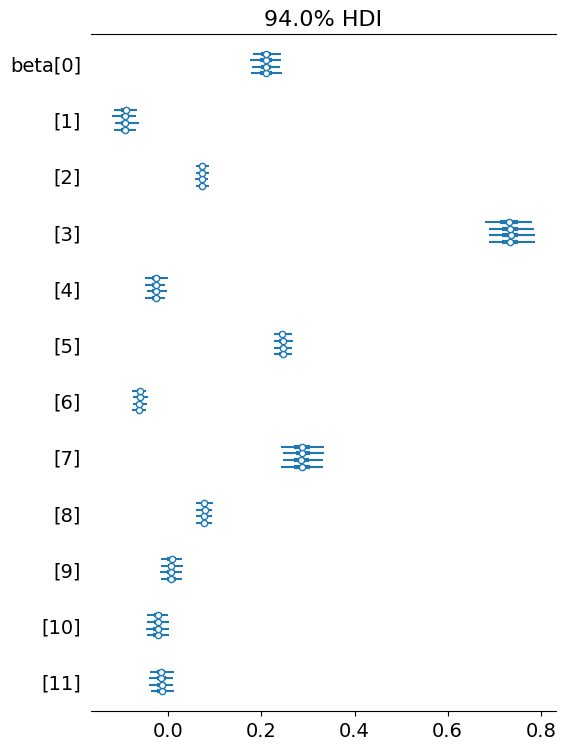

In [105]:
az.plot_forest(linear_trace, var_names="beta");

In [106]:
# Compute WAIC and LOO for Model Comparison
try:
    # Compute WAIC
    linear_waic = az.waic(linear_trace)
    print(f"WAIC: {linear_waic}")

    # Compute LOO
    linear_loo = az.loo(linear_trace)
    print(f"LOO: {linear_loo}")

except Exception as e:
    print("Error in computing WAIC/LOO:", str(e))

WAIC: Computed from 4000 posterior samples and 827 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  2258.90    38.82
p_waic       29.33        -

There has been a warning during the calculation. Please check the results.
LOO: Computed from 4000 posterior samples and 827 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  2259.04    38.75
p_loo       29.19        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      826   99.9%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    1    0.1%



In [108]:
# Extract Pareto k values
loo_result = az.loo(linear_trace, pointwise=True)
pareto_k = loo_result.pareto_k.values

# Find the index of the problematic observation
problematic_index = np.where(pareto_k > 1)[0]
print(f"Problematic observation index: {problematic_index}")

y.iloc[problematic_index]

Problematic observation index: [390]


390    0.411863
Name: C6H6(GT), dtype: float64

In [115]:
problematic_index[0]

390

In [116]:
start_idx = problematic_index[0] - 5
end_idx = problematic_index[0] + 5
y.iloc[start_idx:end_idx]

385    0.529461
386    0.290041
387    0.163704
388    0.179098
389    0.209405
390    0.411863
391    0.536584
392    0.633781
393    0.509727
394    0.266254
Name: C6H6(GT), dtype: float64

Hierarchical Models

Checking for Implicit Clusters

In [117]:
# Load the dataset
data_path = os.path.join(os.path.dirname(os.path.dirname(os.getcwd())), "dataset")
data = pd.read_excel(f"{data_path}/data_transformed.xlsx")
# Drop the unnamed column as it is unnecessary for correlation analysis
data = data.drop(columns=['Unnamed: 0'])

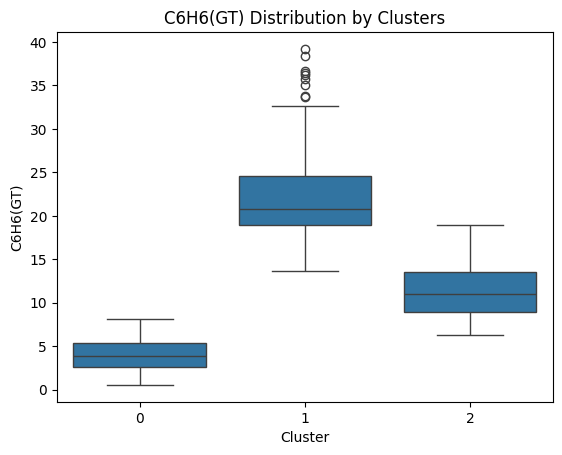

In [118]:
# Select relevant predictors for clustering (ignoring non-informative columns like 'Unnamed: 0')
predictor_columns = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 
                    'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']

# Standardize the predictor variables for clustering
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(data[predictor_columns])

# Apply K-Means clustering to find natural groups in the data
kmeans = KMeans(n_clusters=3, random_state=42)  # Choose 3 clusters as an example
data['cluster'] = kmeans.fit_predict(scaled_features)

# Visualize the distribution of the target variable within the clusters
sns.boxplot(x='cluster', y='C6H6(GT)', data=data)
plt.title("C6H6(GT) Distribution by Clusters")
plt.xlabel("Cluster")
plt.ylabel("C6H6(GT)")
plt.show()

# Summary statistics for each cluster
cluster_summary = data.groupby("cluster")[predictor_columns + ['C6H6(GT)']].mean()

In [119]:
cluster_summary

,CO(GT),PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,C6H6(GT)
cluster,,,,,,,,,,,,,
0,1.099363,981.406847,68.799363,698.687102,71.461783,1229.687367,70.652866,1321.282643,682.866242,12.771842,53.457511,0.763095,3.981506
1,4.513295,1551.542389,545.693642,1349.135356,264.479769,658.124277,137.797688,2050.468690,1598.689788,17.746869,48.152698,0.936480,22.175780
2,2.412941,1241.835049,220.735294,1017.883578,148.476471,872.267402,108.502941,1629.426716,1099.391667,17.119167,45.435024,0.842111,11.241603


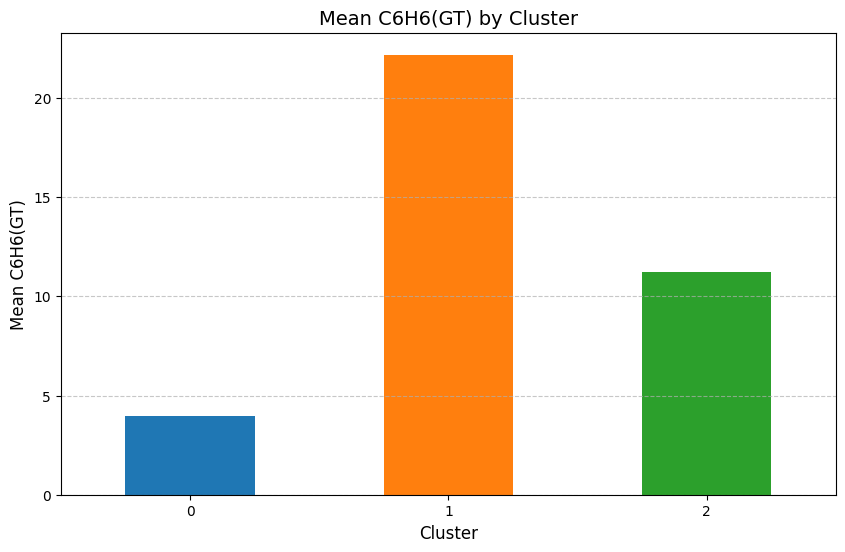

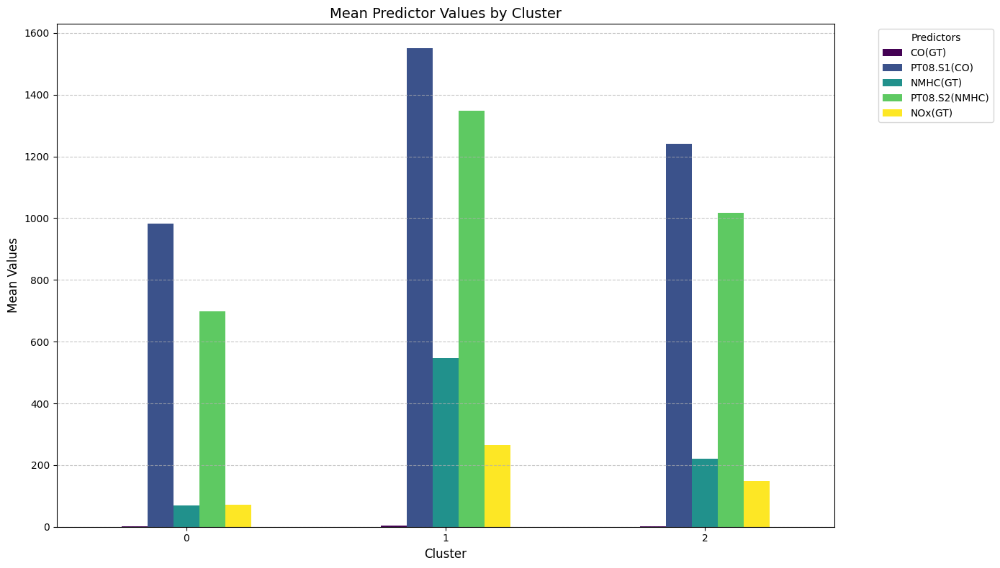

In [120]:
# Compute the mean values for each cluster
cluster_means = data.groupby("cluster")[predictor_columns + ["C6H6(GT)"]].mean()

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
cluster_means["C6H6(GT)"].plot(kind="bar", ax=ax, color=["#1f77b4", "#ff7f0e", "#2ca02c"])
ax.set_title("Mean C6H6(GT) by Cluster", fontsize=14)
ax.set_xlabel("Cluster", fontsize=12)
ax.set_ylabel("Mean C6H6(GT)", fontsize=12)
ax.grid(axis="y", linestyle="--", alpha=0.7)
plt.xticks(rotation=0)
plt.show()

# Visualize a subset of predictors by cluster
fig, ax = plt.subplots(figsize=(14, 8))
cluster_means[predictor_columns[:5]].plot(kind="bar", ax=ax, colormap="viridis")
ax.set_title("Mean Predictor Values by Cluster", fontsize=14)
ax.set_xlabel("Cluster", fontsize=12)
ax.set_ylabel("Mean Values", fontsize=12)
ax.grid(axis="y", linestyle="--", alpha=0.7)
plt.xticks(rotation=0)
plt.legend(title="Predictors", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

Hierarchical Model: Prior Check

In [125]:
# Prepare data for hierarchical modeling
group_idx = data["cluster"].values  # Use clusters as the grouping variable
n_groups = len(np.unique(group_idx))  # Number of clusters/groups
# X = data[predictor_columns].values  # Predictors
# y = data["C6H6(GT)"].values  # Target variable

# # Ensure the target variable is strictly positive
# if (y <= 0).any():
#     y += 0.001

# Define the hierarchical Bayesian model for prior predictive checks
with pm.Model() as hierarchical_model:
    # # Hyperpriors for group-level parameters
    # mu_beta = pm.Normal("mu_beta", mu=0, sigma=10, shape=len(predictor_columns))  # Population-level mean for coefficients
    # sigma_beta = pm.HalfCauchy("sigma_beta", beta=2, shape=len(predictor_columns))  # Population-level variance

    # mu_intercept = pm.Normal("mu_intercept", mu=0, sigma=10)  # Population-level mean for intercept
    # sigma_intercept = pm.HalfCauchy("sigma_intercept", beta=2)  # Population-level variance

    # # Group-level parameters
    # intercept = pm.Normal("intercept", mu=mu_intercept, sigma=sigma_intercept, shape=n_groups)
    # beta = pm.Normal("beta", mu=mu_beta, sigma=sigma_beta, shape=(n_groups, len(predictor_columns)))

    # # Linear predictor for each group
    # mu = pm.math.exp(intercept[group_idx] + pm.math.sum(beta[group_idx] * X, axis=1))

    # # Shape parameter for Gamma likelihood
    # alpha = pm.HalfCauchy("alpha", beta=2)

    # # Likelihood for prior predictive (remove observed data)
    # target = pm.Gamma("target", alpha=alpha, beta=alpha / mu)

    # # Sample prior predictive
    # hierarchical_prior_predictive = pm.sample_prior_predictive()
    
    # Hyperpriors for group-level parameters
    mu_beta = pm.Normal("mu_beta", mu=0, sigma=10, shape=len(predictor_columns))  # Population-level mean for coefficients
    sigma_beta = pm.HalfNormal("sigma_beta", sigma=2, shape=len(predictor_columns))  # Population-level variance

    mu_intercept = pm.Normal("mu_intercept", mu=0, sigma=10)  # Population-level mean for intercept
    sigma_intercept = pm.HalfNormal("sigma_intercept", sigma=2)  # Population-level variance

    # Non-centered parameterization for group-level effects
    beta_raw = pm.Normal("beta_raw", mu=0, sigma=1, shape=(n_groups, len(predictor_columns)))
    beta = pm.Deterministic("beta", mu_beta + beta_raw * sigma_beta)

    intercept_raw = pm.Normal("intercept_raw", mu=0, sigma=1, shape=n_groups)
    intercept = pm.Deterministic("intercept", mu_intercept + intercept_raw * sigma_intercept)

    # Linear predictor for each group (apply exp() for Gamma likelihood)
    mu = pm.math.exp(intercept[group_idx] + pm.math.sum(beta[group_idx] * X, axis=1))

    # Shape parameter for Gamma likelihood
    alpha = pm.Exponential("alpha", lam=1)  # More stable than HalfCauchy

    # Likelihood for prior predictive (remove observed data)
    target = pm.Gamma("target", alpha=alpha, beta=alpha / mu)

    # Sample prior predictive
    hierarchical_prior_predictive = pm.sample_prior_predictive()

Sampling: [alpha, beta_raw, intercept_raw, mu_beta, mu_intercept, sigma_beta, sigma_intercept, target]


Hierarchical Model: Posterior Check

In [126]:
# Define the hierarchical Bayesian model
with hierarchical_model:
    # # Hyperpriors for group-level parameters
    # mu_beta = pm.Normal("mu_beta", mu=0, sigma=10, shape=len(predictor_columns))  # Population-level mean for coefficients
    # sigma_beta = pm.HalfCauchy("sigma_beta", beta=2, shape=len(predictor_columns))  # Population-level variance

    # mu_intercept = pm.Normal("mu_intercept", mu=0, sigma=10)  # Population-level mean for intercept
    # sigma_intercept = pm.HalfCauchy("sigma_intercept", beta=2)  # Population-level variance

    # # Group-level parameters
    # intercept = pm.Normal("intercept", mu=mu_intercept, sigma=sigma_intercept, shape=n_groups)
    # beta = pm.Normal("beta", mu=mu_beta, sigma=sigma_beta, shape=(n_groups, len(predictor_columns)))

    # # Linear predictor for each group
    # mu = pm.math.exp(intercept[group_idx] + pm.math.sum(beta[group_idx] * X, axis=1))

    # # Shape parameter for Gamma likelihood
    # alpha = pm.HalfCauchy("alpha", beta=2)

    # # Likelihood
    # target = pm.Gamma("target", alpha=alpha, beta=alpha / mu, observed=y)

    # # Sample the posterior
    # hierarchical_trace = pm.sample(1000, tune=500, init="adapt_diag", return_inferencedata=True)
    
    
    # Initialize model with a custom start point
    initial_point = hierarchical_model.initial_point()
    
    # Sample the posterior
    hierarchical_trace = pm.sample(
        1000, 
        tune=1000, 
        init="adapt_diag", 
        chains=4, 
        target_accept=0.95, 
        max_treedepth=15, 
        return_inferencedata=True
    )

Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 3 jobs)
NUTS: [mu_beta, sigma_beta, mu_intercept, sigma_intercept, beta_raw, intercept_raw, alpha, target]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2959 seconds.
There were 20 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


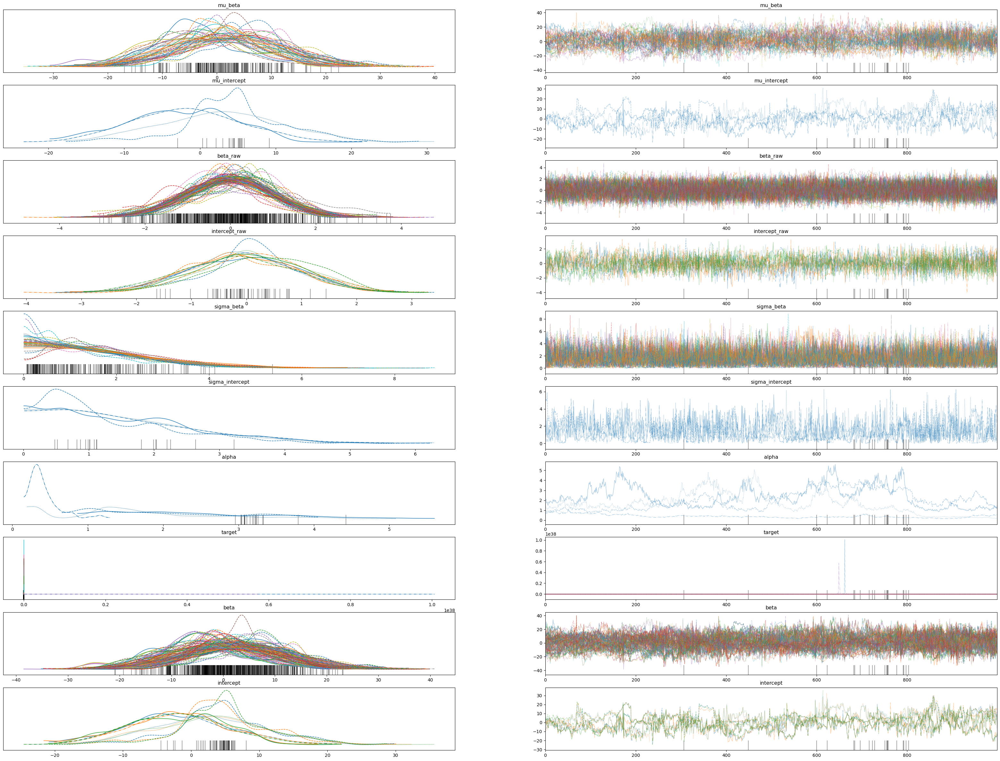

In [127]:
# Save and display posterior diagnostics
# posterior_summary = az.summary(student_t_summary)
az.plot_trace(hierarchical_trace, figsize=(40, 30), compact=True) #, var_names=scaled_data.columns
# plt.savefig("traceplot_beta_intercept_alpha.png")
plt.show()

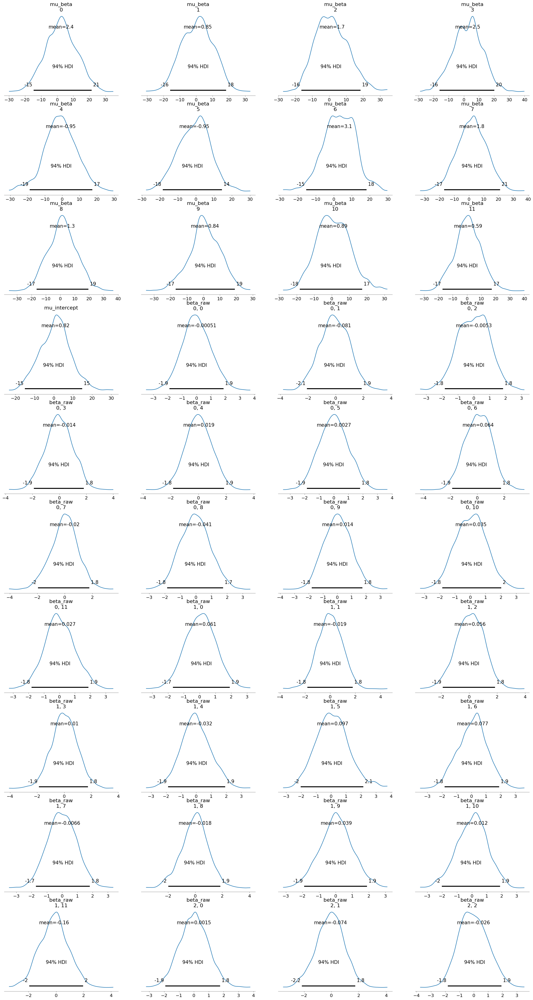

In [128]:
az.plot_posterior(hierarchical_trace.posterior)
# plt.savefig("posterior_beta_intercept_alpha.png")
plt.show()

In [ ]:
type(trace_student_t.posterior["beta"])

In [ ]:
hierarchical_prior_predictive.prior["beta"].values.shape

In [ ]:
# Compare priors and posteriors for beta (coefficients)
for i, feature in enumerate(predictor_columns):
    plt.figure(figsize=(10, 6))
    for group in range(n_groups):  # Iterate over groups
        prior_samples = hierarchical_prior_predictive.prior["beta"].values[:, :, group, i]#.flatten() #.sel(beta_dim_0=group, beta_dim_1=i).values.flatten()#
        # print(prior_samples.shape)
        posterior_samples = hierarchical_trace.posterior["beta"].sel(beta_dim_0=group, beta_dim_1=i).values.flatten()

        sns.kdeplot(prior_samples, fill=True, alpha=0.3, label=f"Prior Group {group + 1}")
        sns.kdeplot(posterior_samples, fill=True, alpha=0.7, label=f"Posterior Group {group + 1}")

    plt.title(f"Prior vs. Posterior for Beta ({feature}) Across Groups")
    plt.xlabel("Coefficient Value")
    plt.ylabel("Density")
    plt.legend()
    plt.show()

# # Compare priors and posteriors for intercepts
# plt.figure(figsize=(10, 6))
# for group in range(n_groups):  # Iterate over groups
#     prior_samples = hierarchical_prior_predictive.prior["intercept"][:, group].flatten()
#     posterior_samples = hierarchical_trace.posterior["intercept"].sel(intercept_dim_0=group).values.flatten()

#     sns.kdeplot(prior_samples, fill=True, alpha=0.3, label=f"Prior Group {group + 1}")
#     sns.kdeplot(posterior_samples, fill=True, alpha=0.7, label=f"Posterior Group {group + 1}")

# plt.title("Prior vs. Posterior for Intercepts Across Groups")
# plt.xlabel("Intercept Value")
# plt.ylabel("Density")
# plt.legend()
# plt.show()

Model Evaluation Hierachical

In [ ]:
with hierarchical_model:
    # log_likelihood_gamma = 
    pm.compute_log_likelihood(hierarchical_trace)

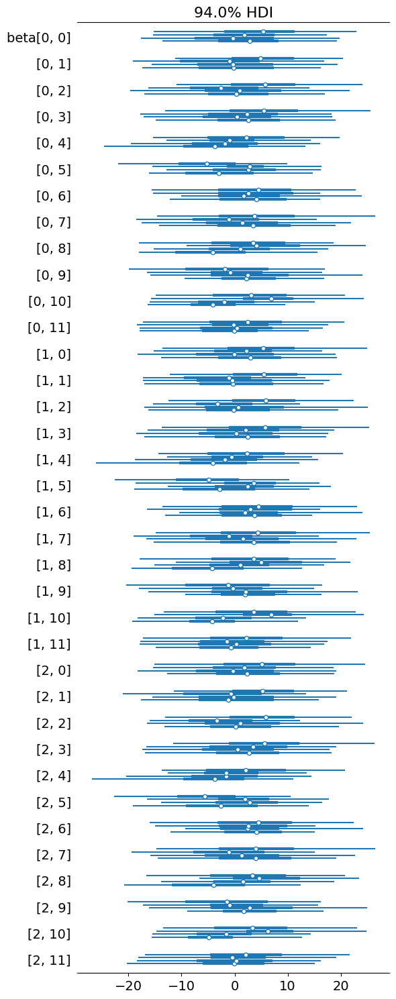

In [129]:
az.plot_forest(hierarchical_trace, var_names="beta");

In [130]:
# Compute WAIC and LOO for Model Comparison
try:
    # Compute WAIC
    hierarchical_waic = az.waic(hierarchical_trace)
    print(f"WAIC: {hierarchical_waic}")

    # Compute LOO
    hierarchical_loo = az.loo(hierarchical_trace)
    print(f"LOO: {hierarchical_loo}")

except Exception as e:
    print("Error in computing WAIC/LOO:", str(e))

Error in computing WAIC/LOO: log likelihood not found in inference data object


Model Comparison

In [ ]:
df_comp_loo_stduent_t_gamma_linear_hierarchical = az.compare({"Student-t": trace_student_t, "Gamma": idata, "Linear Model (Bayesian)": linear_trace, "Hierarchical Model": hierarchical_trace})
df_comp_loo_stduent_t_gamma_linear_hierarchical

In [ ]:
az.plot_compare(df_comp_loo_stduent_t_gamma_linear_hierarchical, insample_dev=False);